# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [2]:
# if plotnine is not installed in Jupter then use the following command to install it 
!pip install plotnine --user

You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.10/bin/python3.10 -m pip install --upgrade pip' command.


Running this project require the following imports 

In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
# from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist

# %matplotlib inline

In [4]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = ['b','r','g','c','m','y','k','#00EEEE','#A9A9A9','#FF8C00','#68228B']  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



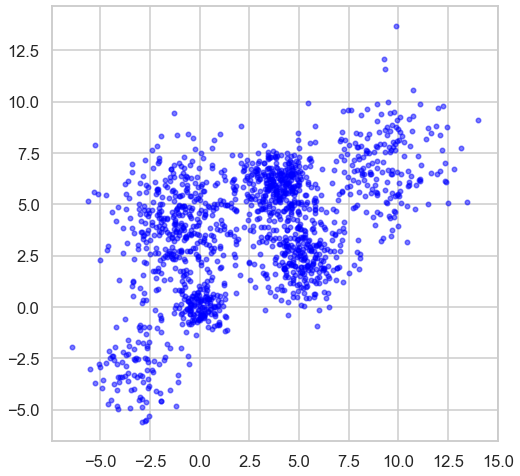

In [5]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

In [137]:
def kmeanss(i,data): 
    kmeans=KMeans(n_clusters=i, init='random', n_init=10, max_iter=300,tol=1e-04)
    kmeans.fit(data)
    display_cluster(data,kmeans,i)
    plt.show()

In [160]:
def KMEANS(data):
    i=2
    while i<10:  
        kmeanss(i,data)
        i+=1

    i=2
    distortions=[]
    while i<10:       
        kmeans=KMeans(n_clusters=i, init='random', n_init=10, max_iter=300,tol=1e-04, random_state=0)
        kmeans.fit(data)    
        distortions.append(kmeans.inertia_)                                           
        i+=1
    plt.plot(list(range(2,10)) , distortions, 'bx-')
    plt.xlabel('Values of K')
    plt.ylabel('Distortion')
    plt.title('The Elbow method for values of K')
    plt.show()   
    score_arr = []
    i=2
    while i<10:       
        kmeans=KMeans(n_clusters=i, init='random', n_init=10, max_iter=300,tol=1e-04, random_state=0)
        kmeans.fit(data) 
        score = silhouette_score(data,kmeans.labels_)
        score_arr.append(score)
        i+=1

    plt.plot(list(range(2,10)) , score_arr, 'bx-')
    plt.xlabel('Values of K')
    plt.ylabel('Silhouette score ')
    plt.title('The silhouette score for values of k ')
    plt.show()



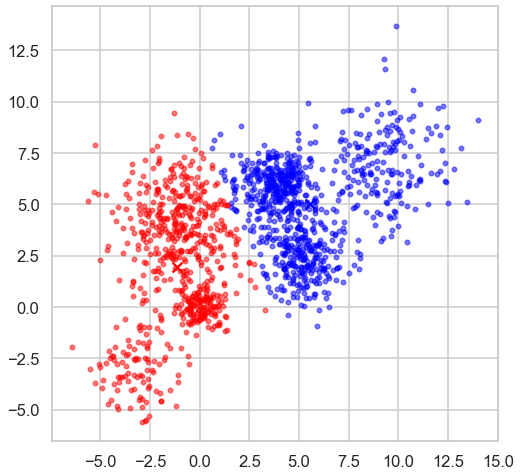

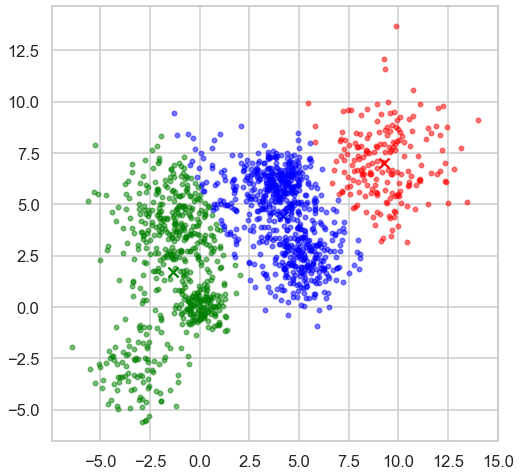

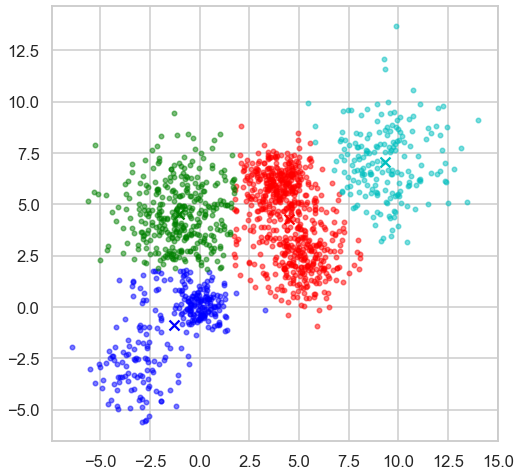

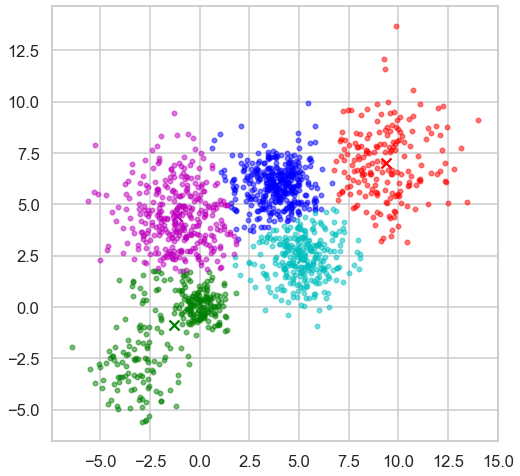

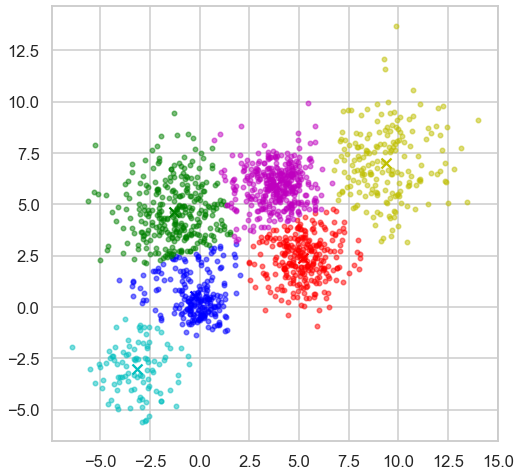

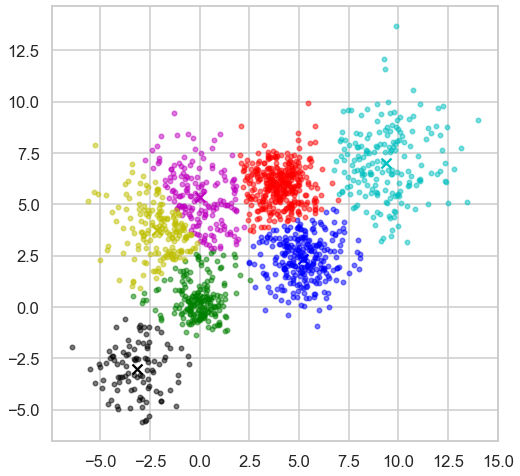

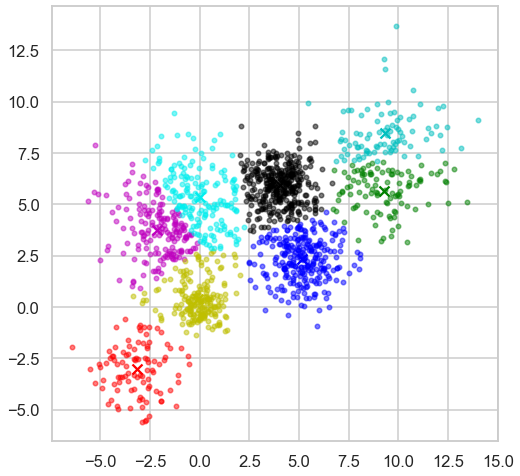

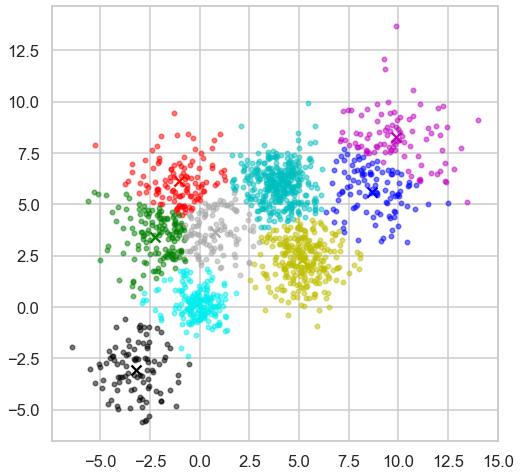

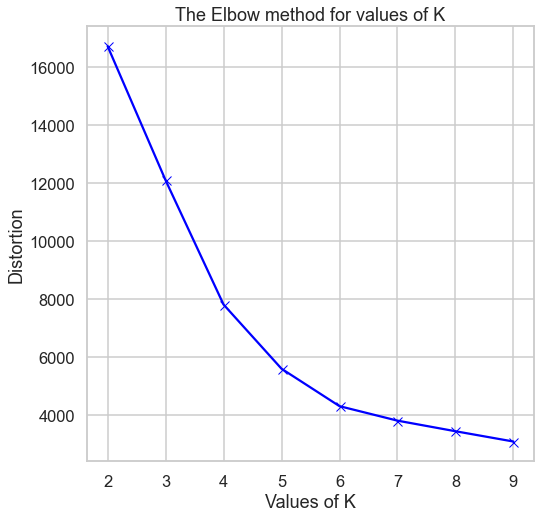

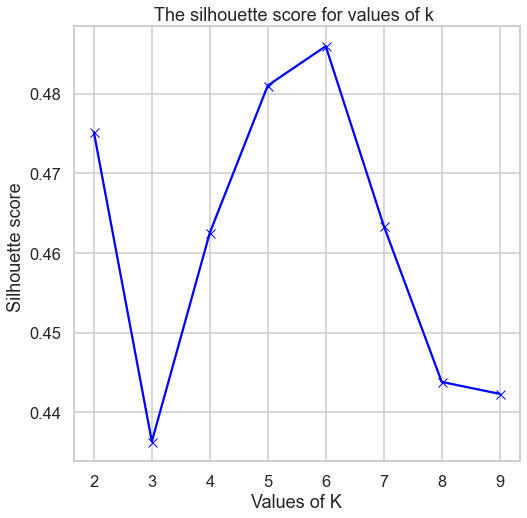

In [161]:
KMEANS(Multi_blob_Data)

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

In [64]:
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc

In [70]:
def plot_dendrogram(model):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            #     Values less than n_samples correspond to leaves of the tree which are the original samples.
            if child_idx < n_samples:
                current_count += 1  # leaf node
            #     A node i greater than or equal to n_samples is a non-leaf node and has children children_[i - n_samples]    
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix)

In [119]:
def hiearchial_clustering(data):
    N_clusters = []
    score_arr= []
    affinities = ['euclidean',  'manhattan', 'cosine']
    linkages = ['single','average']
    link=[]
    affinity=[]
    arr_aff_link=[]
    dis=[]
    for affin in affinities:
        for links in linkages: 

                aggo = AgglomerativeClustering(n_clusters = None, affinity = affin, linkage =links,
                                            distance_threshold = 3).fit(data)

                plot_dendrogram(aggo)
                plt.ylabel('distance ')
                plt.title("Dendogram of affinity: {} and linkage {} ".format(affin,links))
                plt.show()                
                lol=max(aggo.distances_)
                distances=list(np.arange((lol/2),lol,0.1))

                for dist in distances:
                    agg = AgglomerativeClustering(n_clusters = None, affinity = affin, linkage =links,
                                            distance_threshold = dist).fit(data)
                    labels=agg.labels_
                    num_clusters = len(np.unique(labels))
                    if num_clusters>1:
                        dis.append(dist)
                        arr_aff_link.append([affin,links])
                        affinity.append(affin)
                        link.append(links)
                        score = silhouette_score(data, labels)
                        score_arr.append(score)
    #                     plt.scatter(Multi_blob_Data[0], Multi_blob_Data[1], c = agg.fit_predict(Multi_blob_Data), cmap ='rainbow',s =13)
    #                     plt.title("Affinity: {} || Linkage: {} || Number of clusters: {}".format(affin,links,agg.n_clusters_))
    #                     plt.show()

    print("best score is ",max(score_arr), "and came from affinity ",arr_aff_link[(np.where(score_arr ==max(score_arr)))[0][0]][0],"and linkage ",arr_aff_link[(np.where(score_arr ==max(score_arr)))[0][0]][1])
    # print(dis[(np.where(score_arr ==max(score_arr)))])
    # plt.plot(N_clusters , score_arr, 'bx-')
    # plt.xlabel('Values of K')
    # plt.ylabel('Silhouette score ')
    # plt.title('The silhouette score for values of k ')
    # plt.show()        


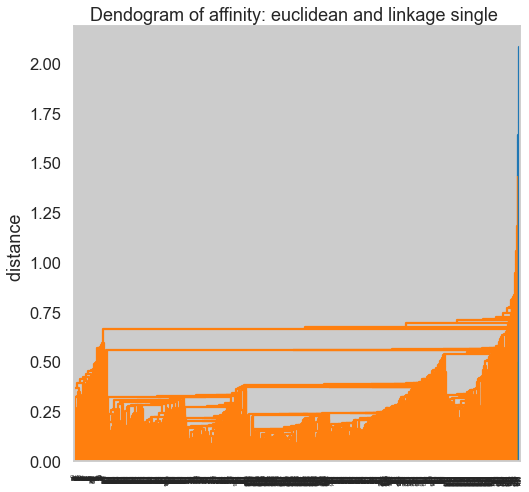

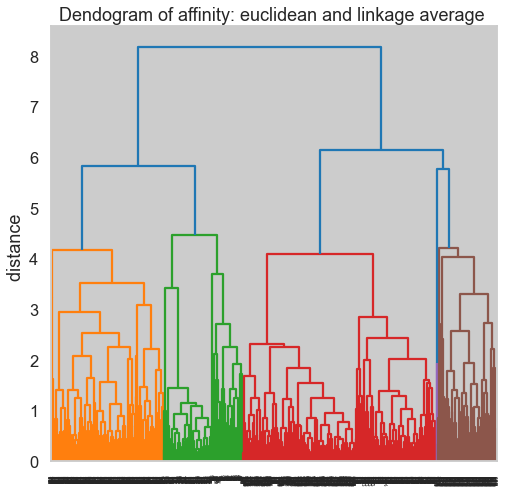

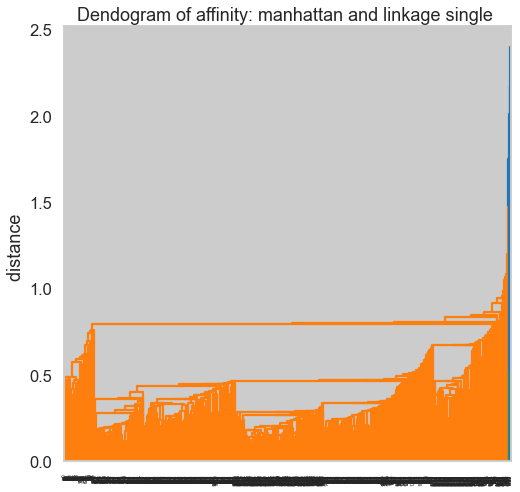

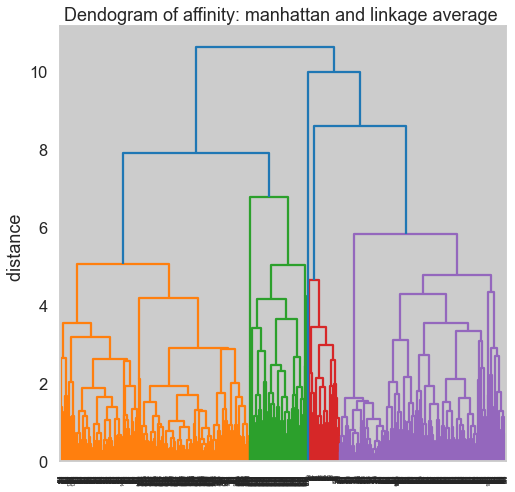

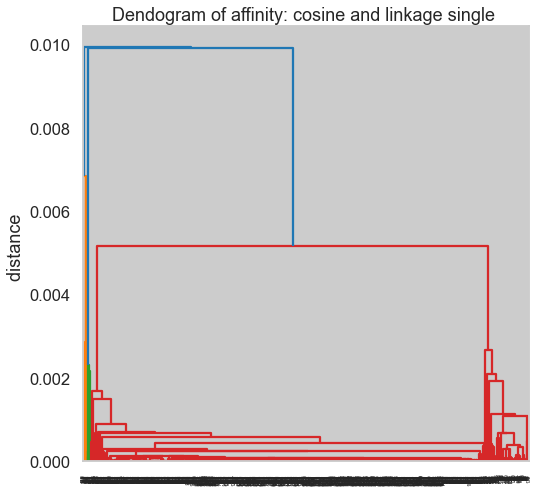

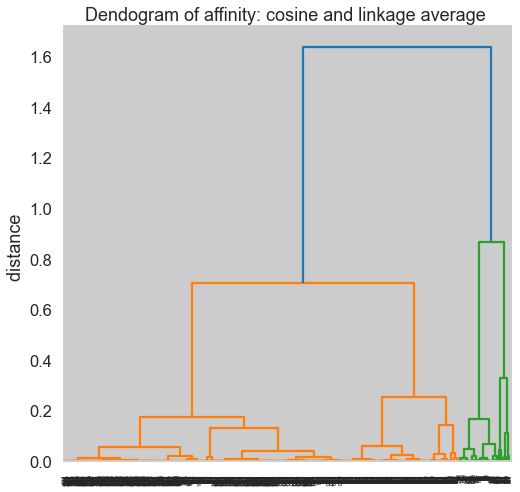

best score is  0.4716908069861964 and came from affinity  euclidean and linkage  average


In [120]:
hiearchial_clustering(Multi_blob_Data)

# DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

In [121]:
def Dbscan(data):
    N_clusters = []
    score_arr= []
    EPS=list(np.arange(0.1,3.1,0.1))
    Min_samples=list(np.arange(5,25,1))
    arr_eps_samp=[]
    epss=[]
    samps=[]
    for eps in EPS:
        for samp in Min_samples:    
            dbscan = DBSCAN(eps = eps, min_samples = samp).fit(data)
            labels = dbscan.labels_
            num_clusters = len(np.unique(labels))

            if num_clusters>1:
                arr_eps_samp.append([eps,samp])
                epss.append(eps)
                samps.append(samp)
                score = silhouette_score(data, labels)
                score_arr.append(score)

    print("best score is ",max(score_arr), "and came from eps ",arr_eps_samp[(np.where(score_arr ==max(score_arr)))[0][0]][0],"and sample",arr_eps_samp[(np.where(score_arr ==max(score_arr)))[0][0]][1])
    plt.plot( range(0,len(score_arr)), score_arr)
    plt.xlabel('length of scores')
    plt.ylabel('Silhouette score ')
    plt.title('The silhouette score for values for combinations of eps and samples ')
    plt.show()        
    plt.plot( epss, score_arr)
    plt.xlabel('epsilons')
    plt.ylabel('Silhouette score ')
    plt.title('The silhouette score for values of epsilons')
    plt.show()
    plt.plot( samps, score_arr)
    plt.xlabel('length of scores')
    plt.ylabel('Silhouette score ')
    plt.title('The silhouette score for values of samples')
    plt.show()
    dbscan = DBSCAN(eps = arr_eps_samp[(np.where(score_arr ==max(score_arr)))[0][0]][0], min_samples = arr_eps_samp[(np.where(score_arr ==max(score_arr)))[0][0]][1]).fit(data)
    labels = dbscan.labels_
    num_clusters = len(np.unique(labels))
    plt.scatter(data[:, 0],data[:,1], c =dbscan.labels_ , cmap= "plasma")
    plt.show() 



best score is  0.4685207355522043 and came from eps  2.1 and sample 6


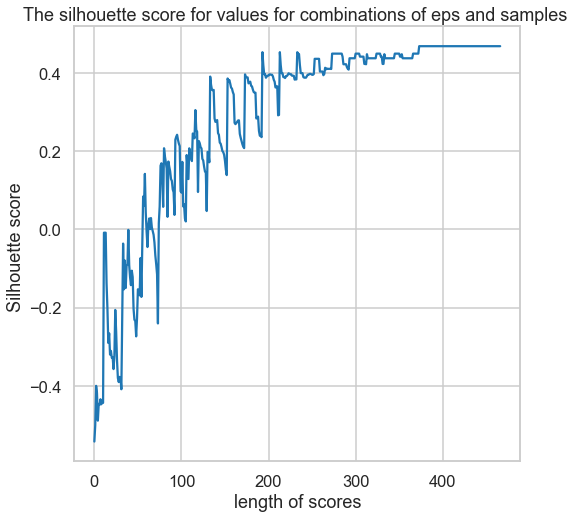

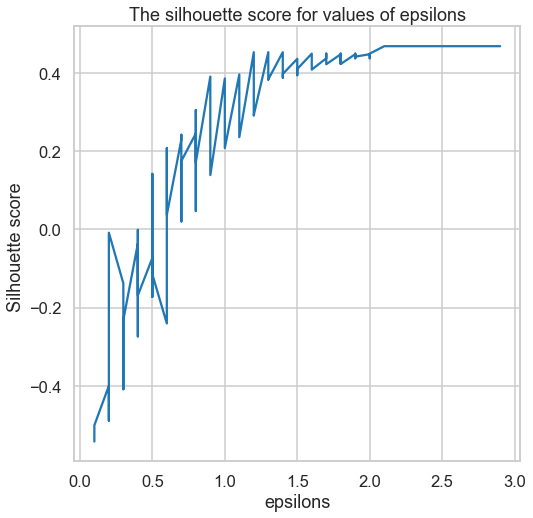

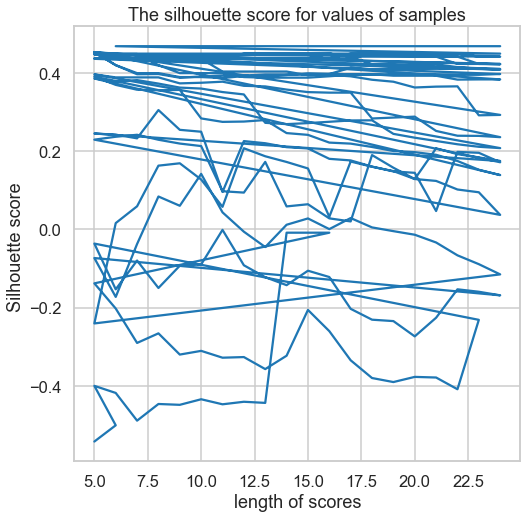

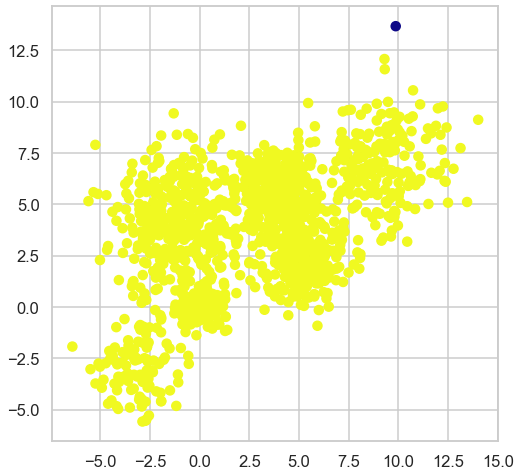

In [122]:
Dbscan(Multi_blob_Data)

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

In [42]:
gmm = GaussianMixture(n_components=2)
gmm.fit(Multi_blob_Data)

GaussianMixture(n_components=2)

In [43]:
print(gmm.means_)
print('\n')
print(gmm.covariances_)

[[ 5.10178879  4.73995367]
 [-1.2910014   1.96003375]]


[[[ 7.97130787  2.4502539 ]
  [ 2.4502539   5.53089845]]

 [[ 2.73213574  1.37761094]
  [ 1.37761094 10.57779677]]]


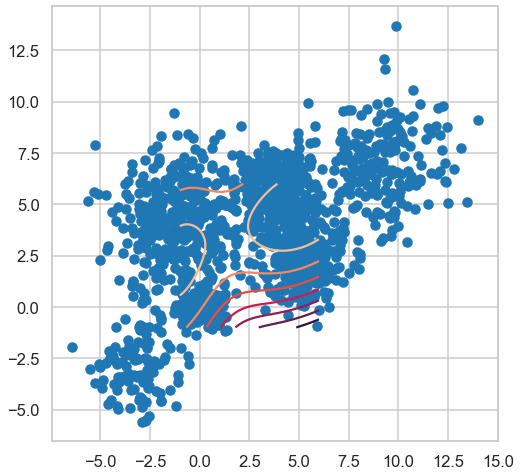

In [44]:
X, Y = np.meshgrid(np.linspace(-1, 6), np.linspace(-1,6))
XX = np.array([X.ravel(), Y.ravel()]).T
Z = gmm.score_samples(XX)
Z = Z.reshape((50,50))
plt.contour(X, Y, Z)
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1])
plt.show()

In [185]:
from sklearn.mixture import GaussianMixture
import seaborn as sns
import plotly.express as px

In [182]:
def Gaussian_cov(data,cov):
    gmm = GaussianMixture(n_components = 4, covariance_type=cov)
    gmm.fit(data)
    
    # Calculating the probability density and storing in df
    #global probs  
    probs = gmm.predict_proba(data)
    #global probs_df 
    probs_df = pd.DataFrame(probs)
        
    # Assign a label to each sample
    labels = gmm.predict(data)
    data['labels'] = labels
    data0 = data[data['labels']== 0]
    data1 = data[data['labels']== 1]
    data2 = data[data['labels']== 2]
    data3 = data[data['labels']== 3]
        
    fig = plt.figure(figsize=(25,25))
    fig.suptitle('Plots for the 4 Mixture Components with {} covariance'.format(cov),fontsize=30)
    fig.subplots_adjust(top=0.95)
    
    # Plotting three clusters in same plot
    plt.subplot(2, 2, 1)
    plt.scatter(data0[0], data0[1], c ='b',s=25)
    plt.scatter(data1[0], data1[1], c ='orange',s=25)
    plt.scatter(data2[0], data2[1], c ='g',s=25)
    plt.scatter(data3[0], data3[1], c ='r',s=25)
    plt.title('Scatter plot of the Mixture Components')
    
    # Visualizing Resultant Distributions
    plt.subplot(2, 2, 2)
    sns.kdeplot(data=probs_df).set(title=' Desnsity plot of the mixture components')
    plt.show()
    
    # 2D Contour plot of resultant Resultant Distributions
    fig = px.density_contour(probs_df)
    fig.update_traces(contours_coloring="fill",contours_showlabels = True) 
    fig.update_layout(title_text='2D Contour Plot of Resultant Distributions', title_x=0.5)
    fig.show()
    

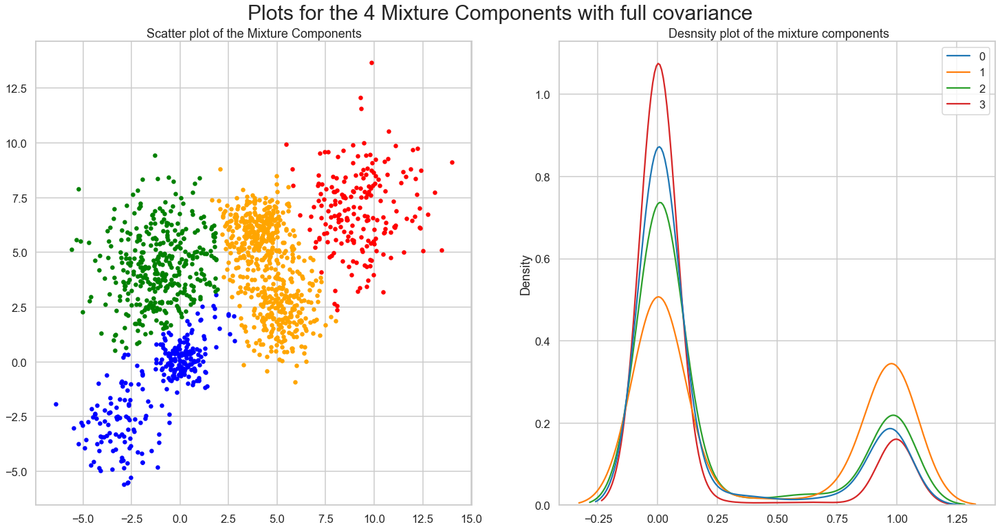

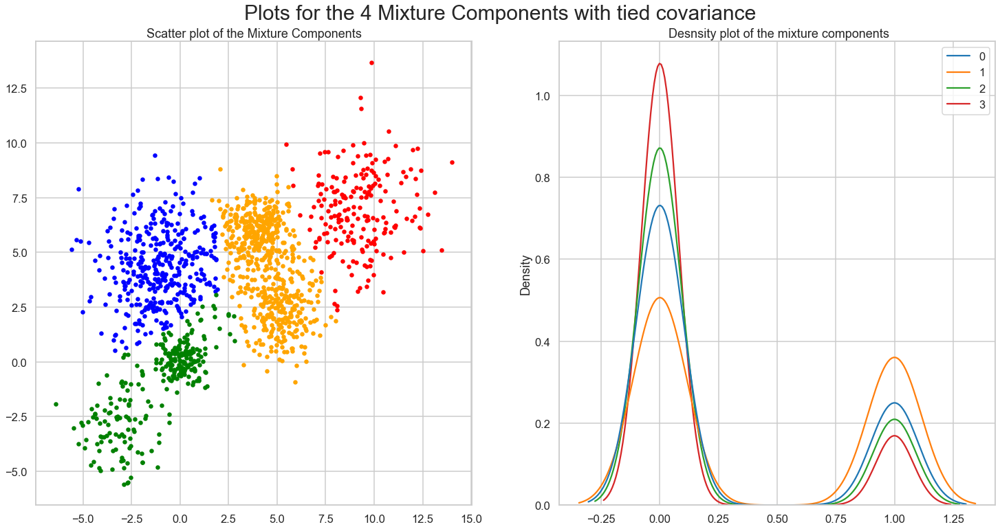

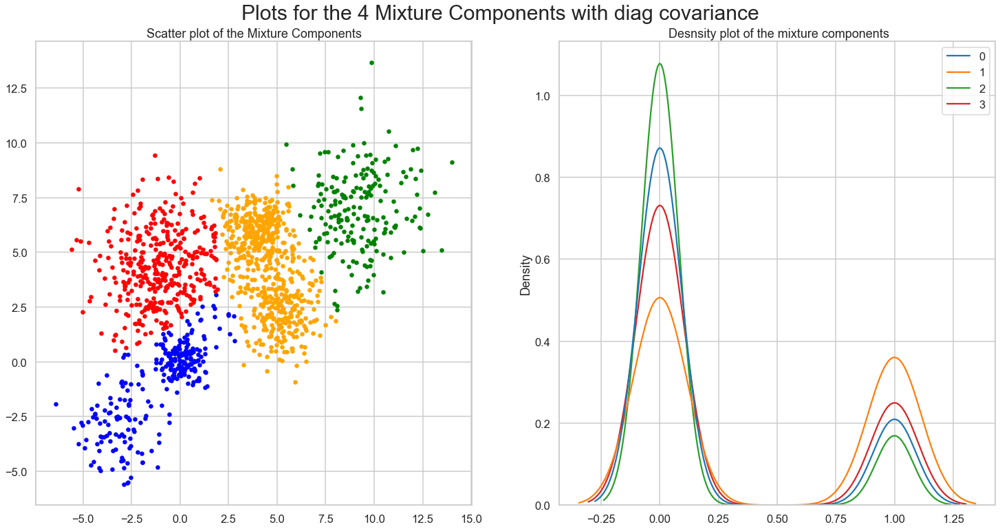

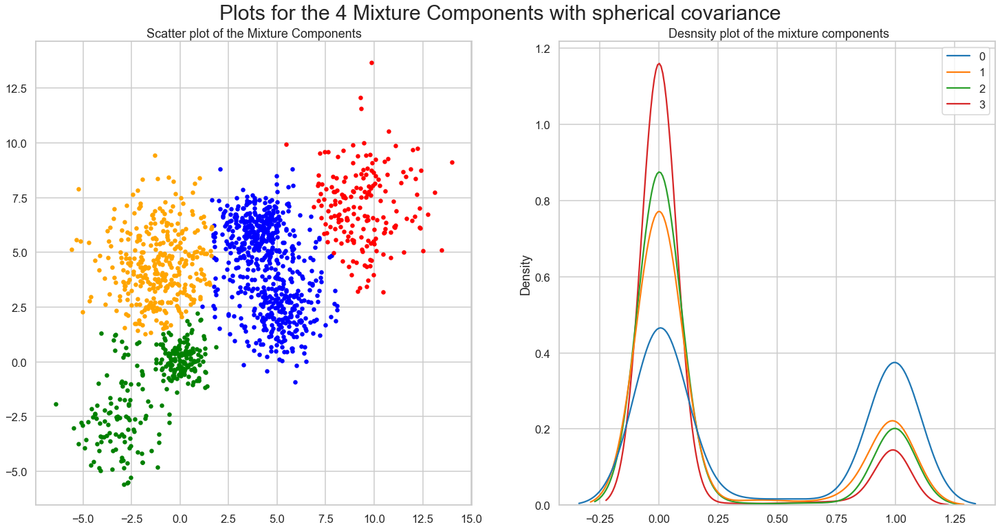

In [35]:
test = np.array(Multi_blob_Data)
Multi_blob_Data_df = pd.DataFrame(test)
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_cov(Multi_blob_Data_df,covars)

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [167]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

In [172]:
data=iris_data['data']
data

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

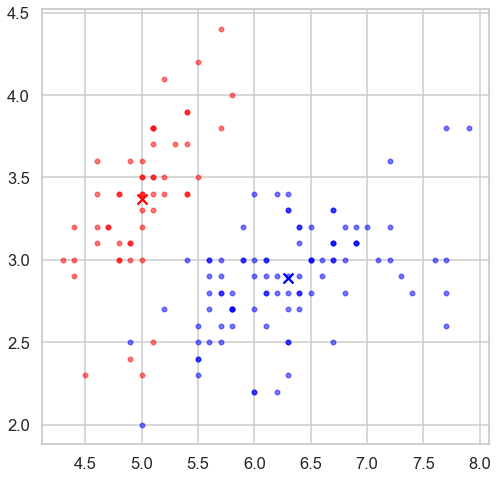

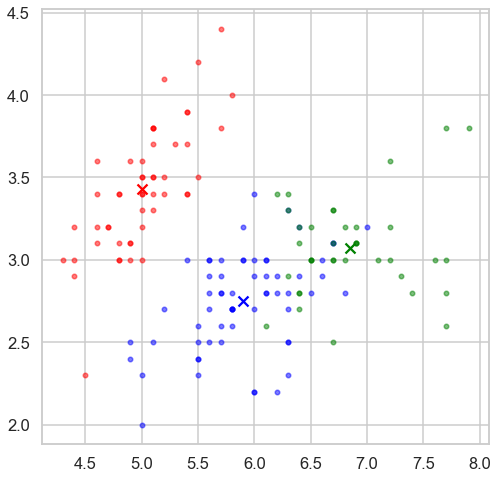

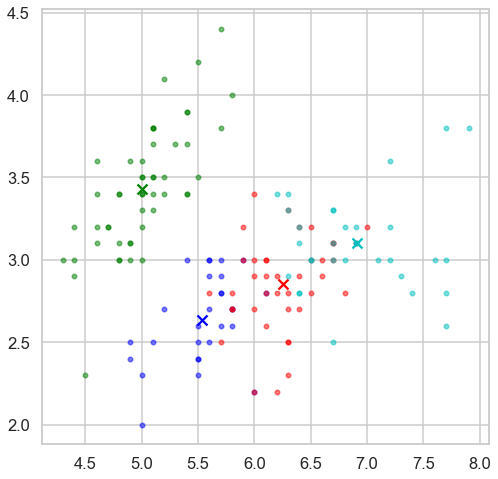

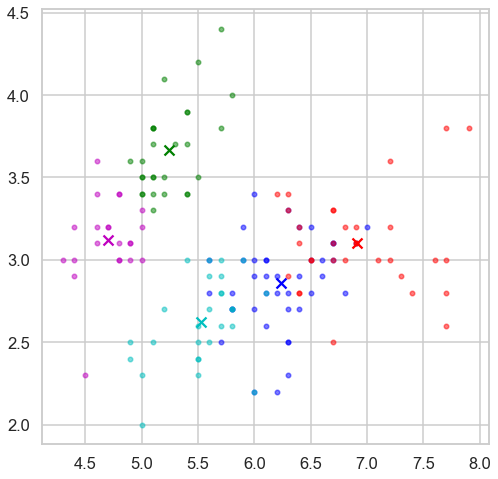

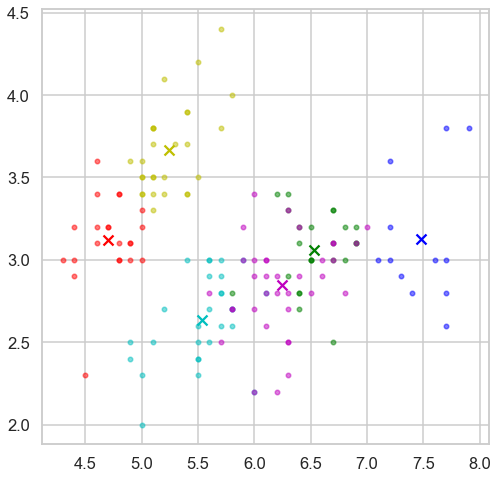

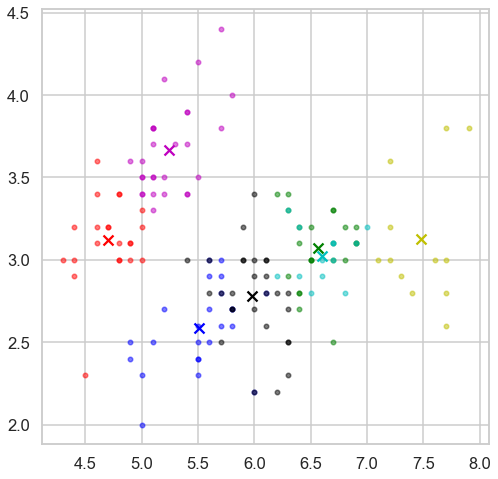

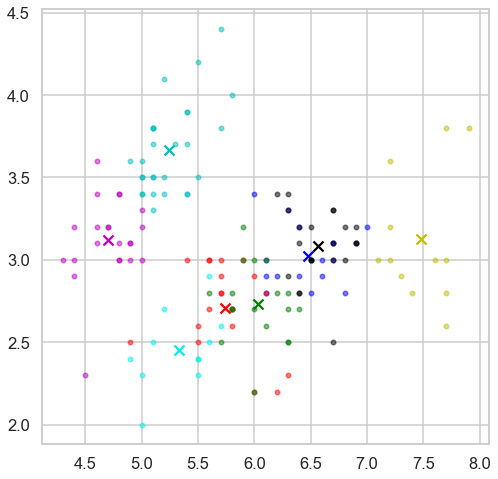

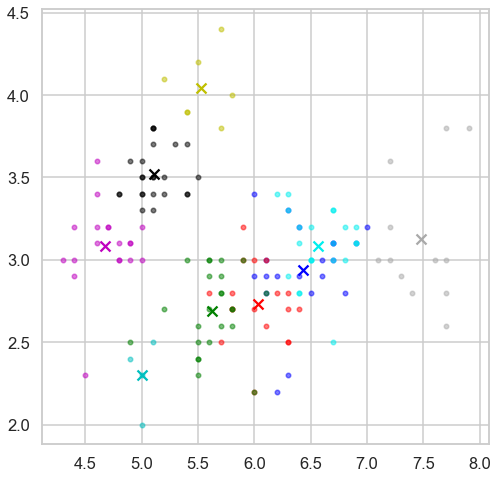

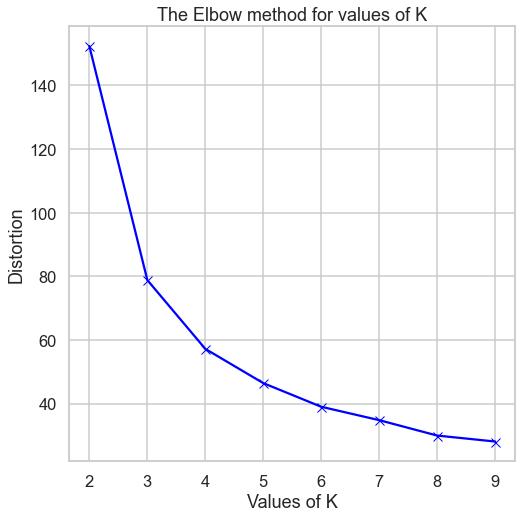

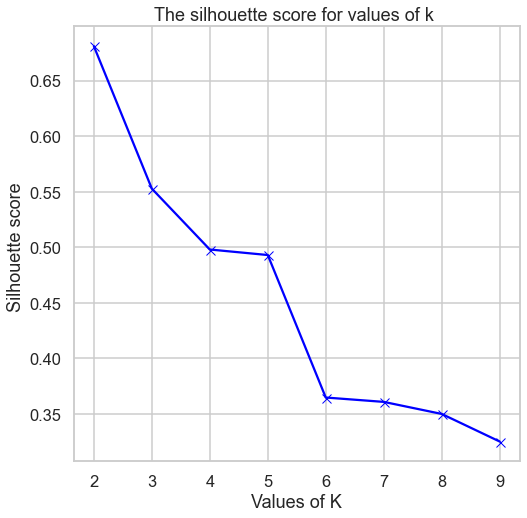

In [190]:
KMEANS(data)

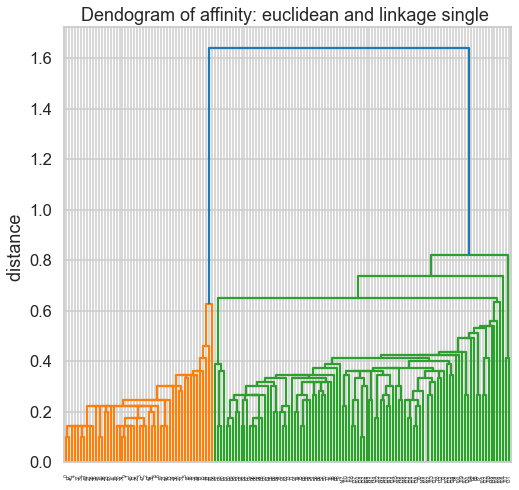

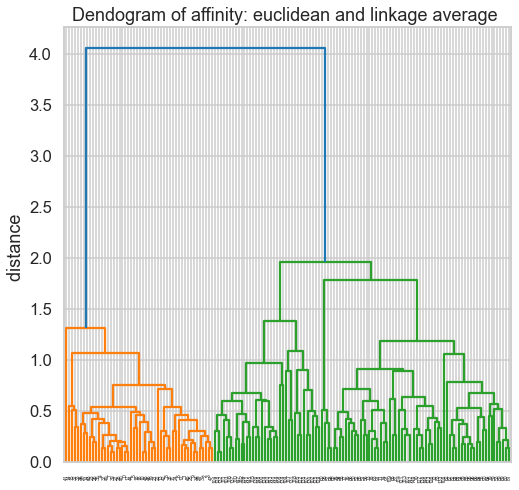

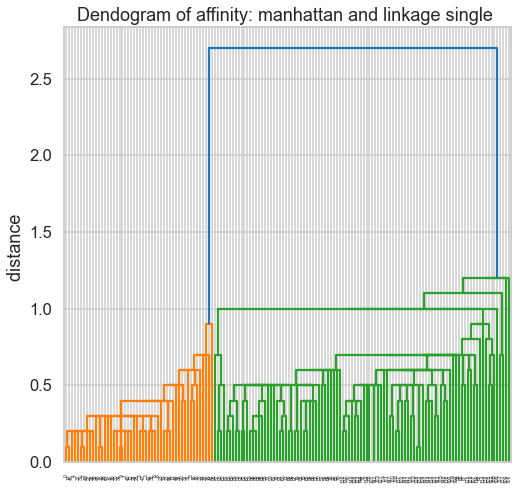

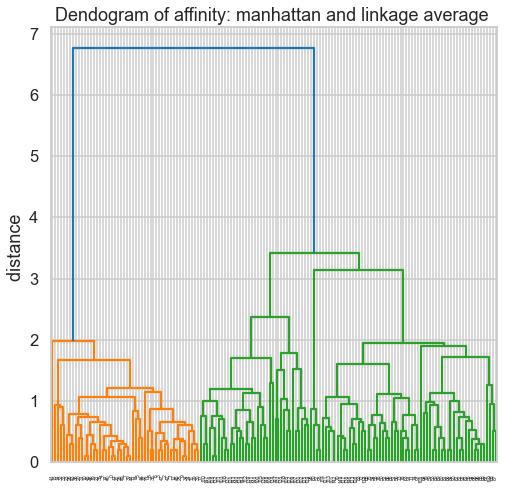

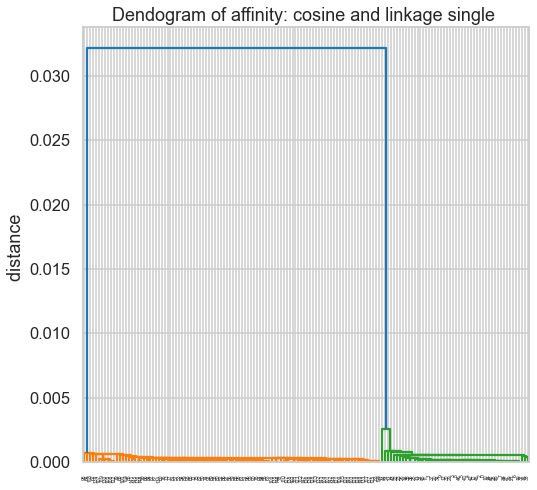

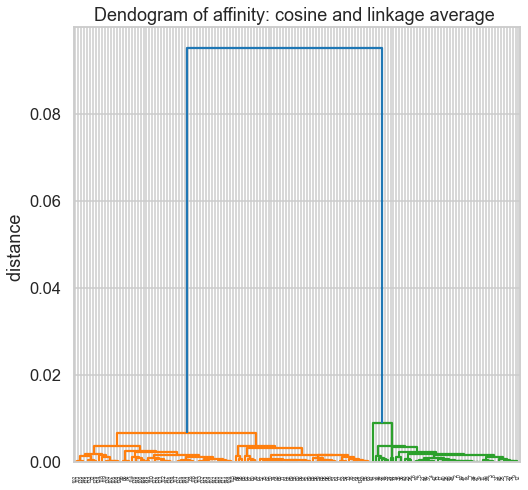

best score is  0.6867350732769776 and came from affinity  euclidean and linkage  single


In [191]:
hiearchial_clustering(data)

best score is  0.6867350732769776 and came from eps  0.9 and sample 5


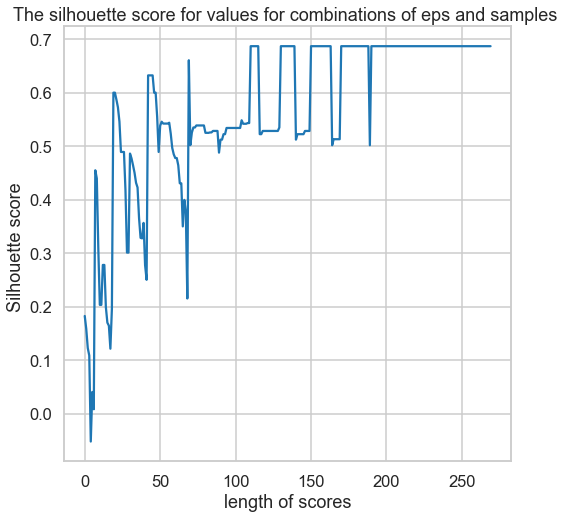

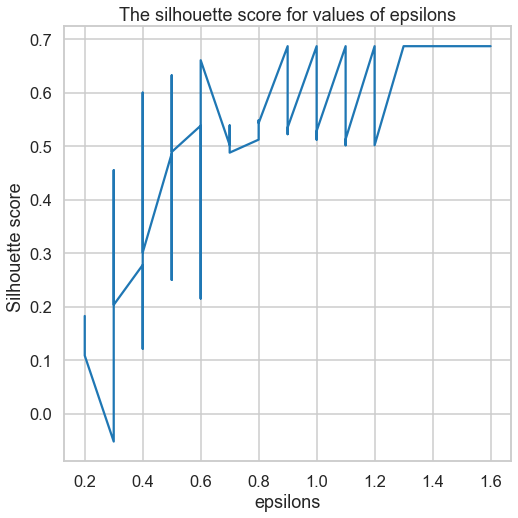

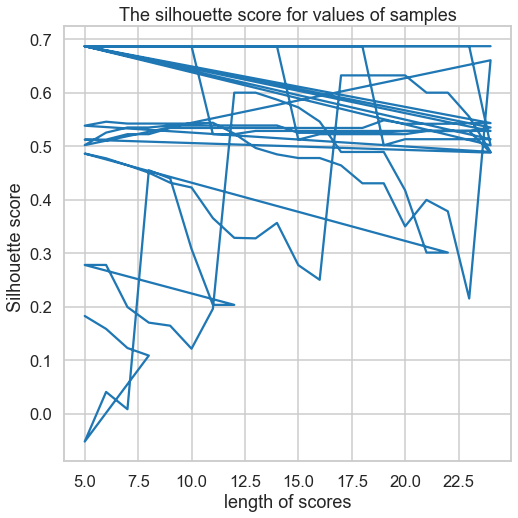

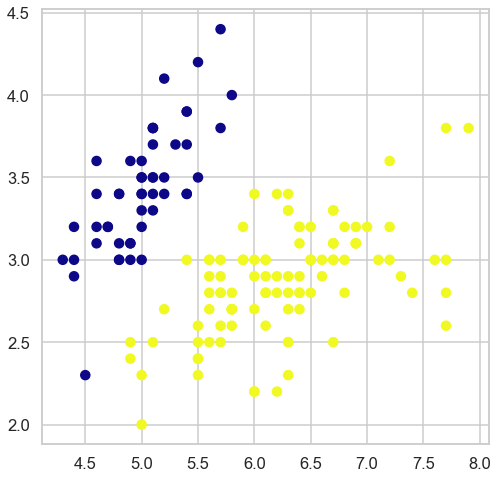

In [192]:
Dbscan(data)

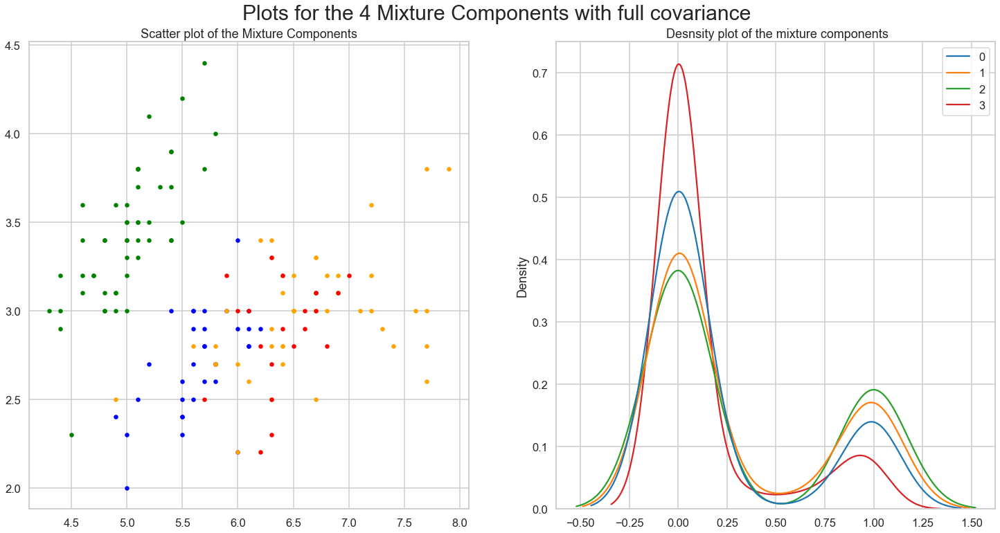

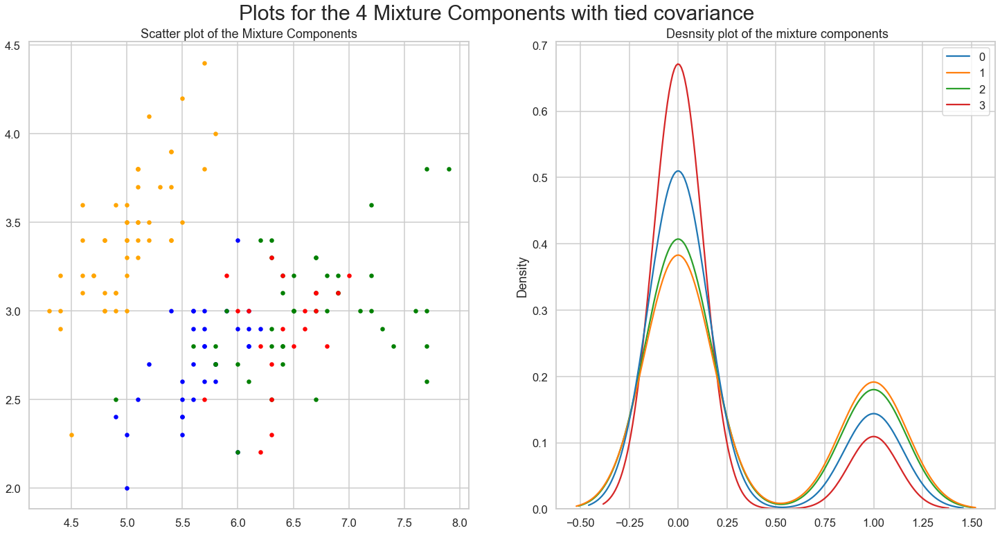

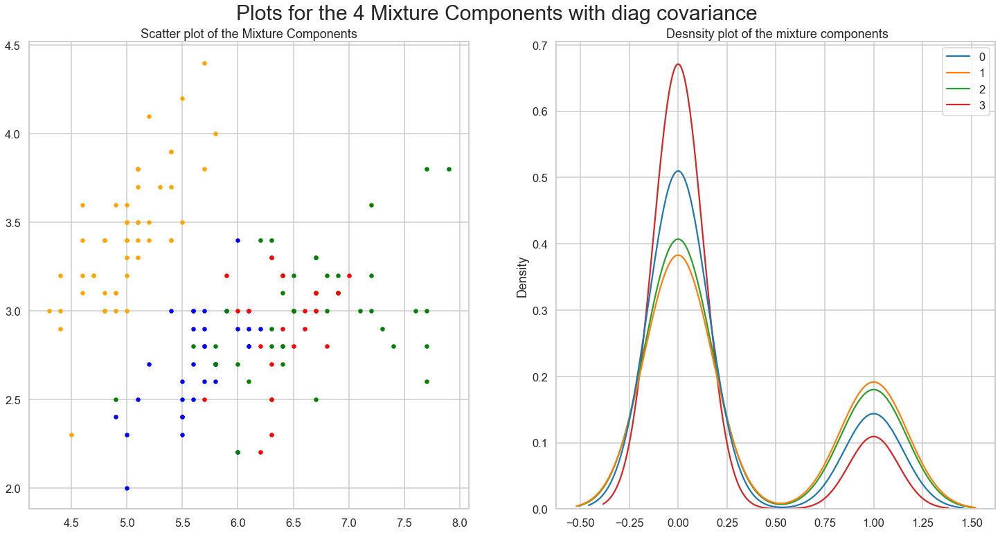

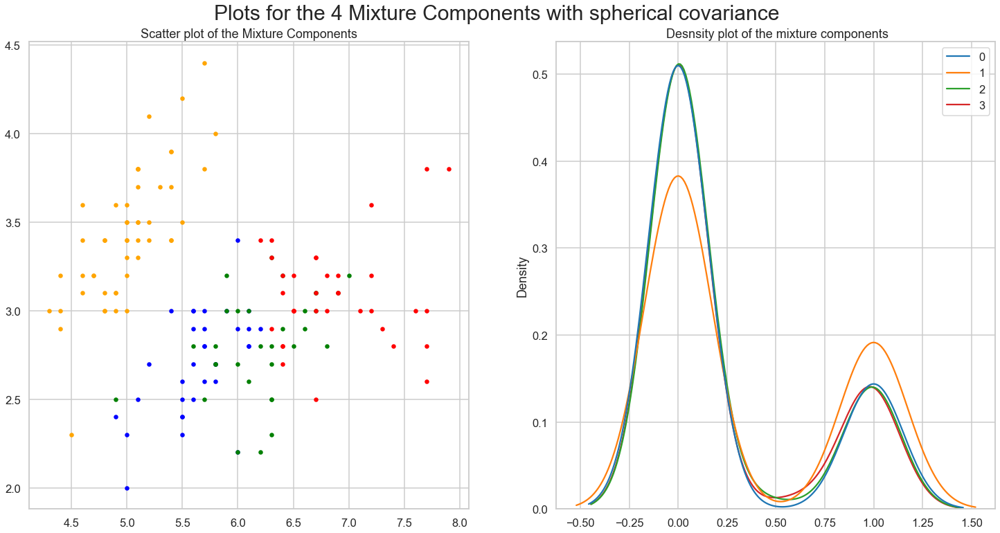

In [193]:
test = np.array(data)
_df = pd.DataFrame(test)
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_cov(_df,covars)

In [178]:
scaler = StandardScaler()
df=pd.DataFrame(iris_data['data'])
scaler.fit(df)
scaled_iris = scaler.transform(df)

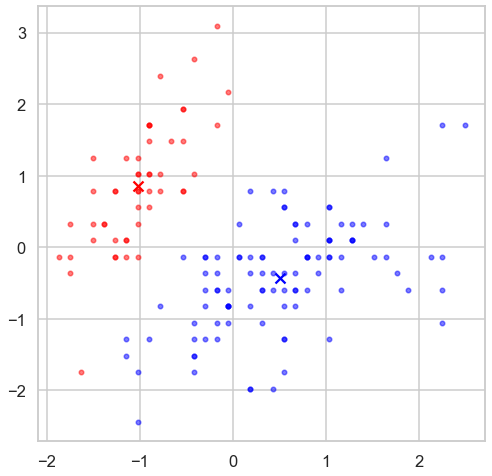

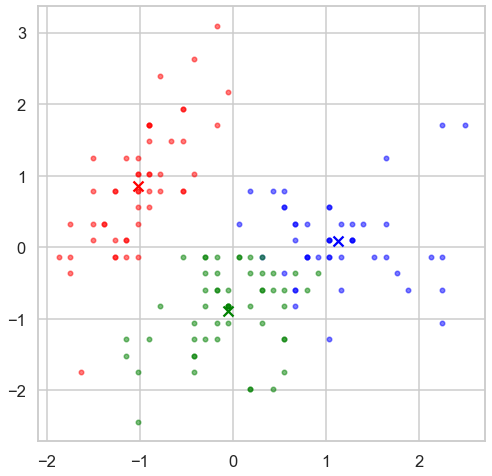

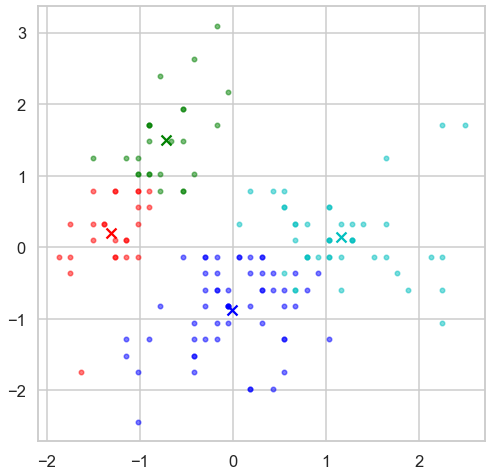

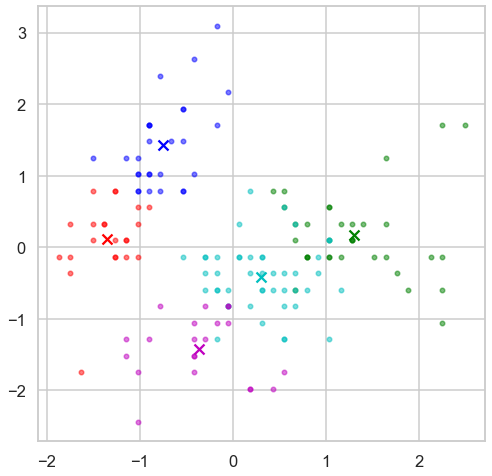

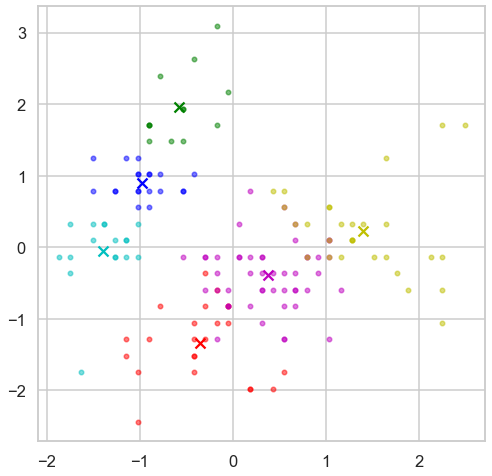

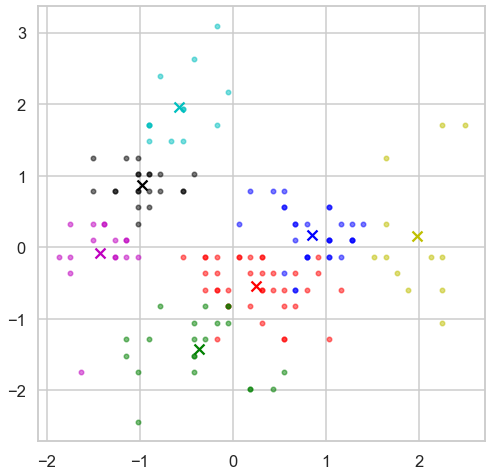

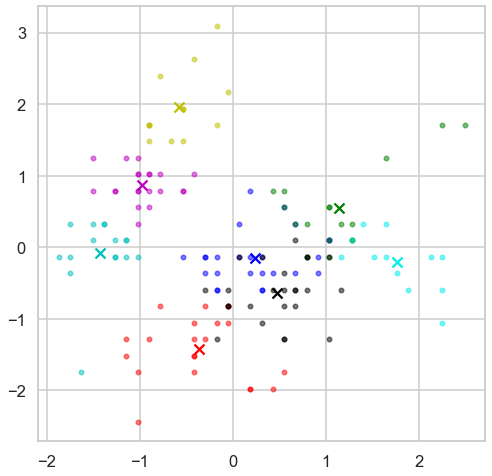

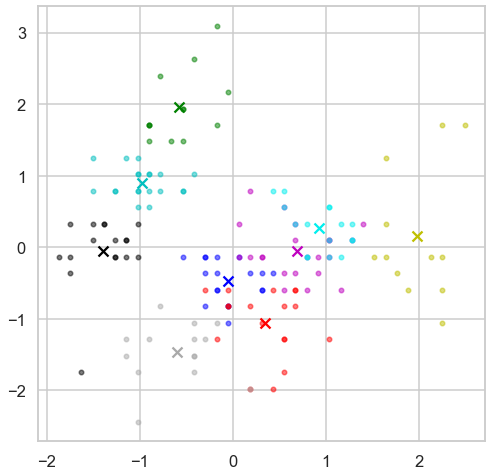

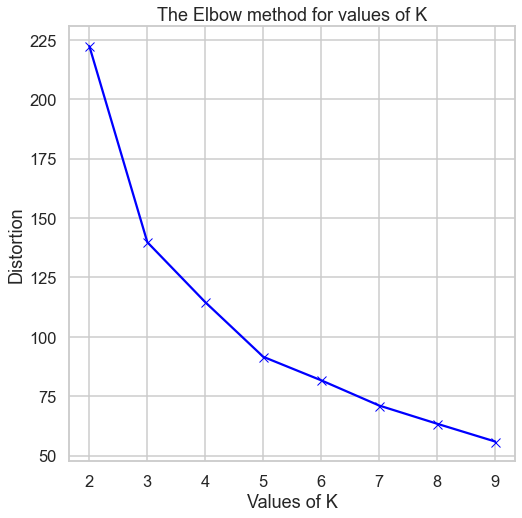

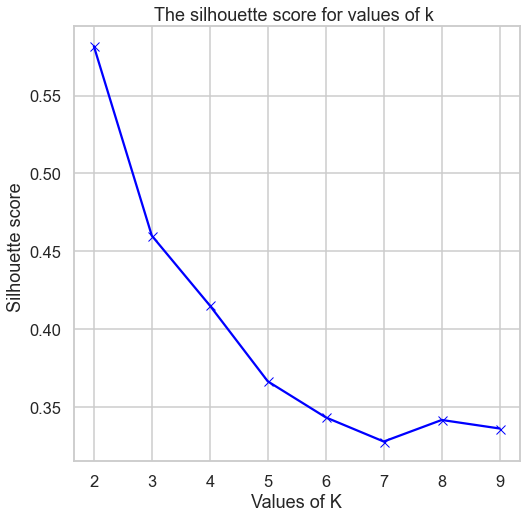

In [179]:
KMEANS(scaled_iris)


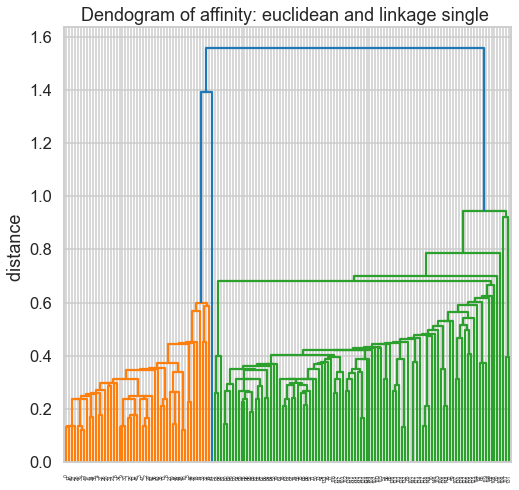

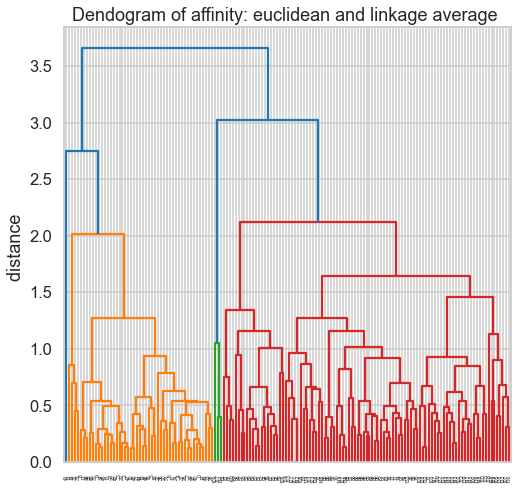

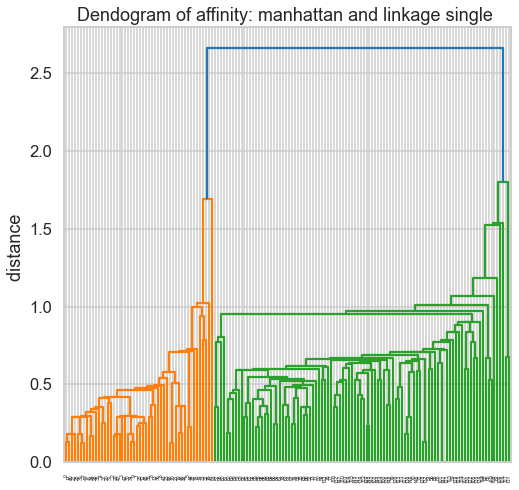

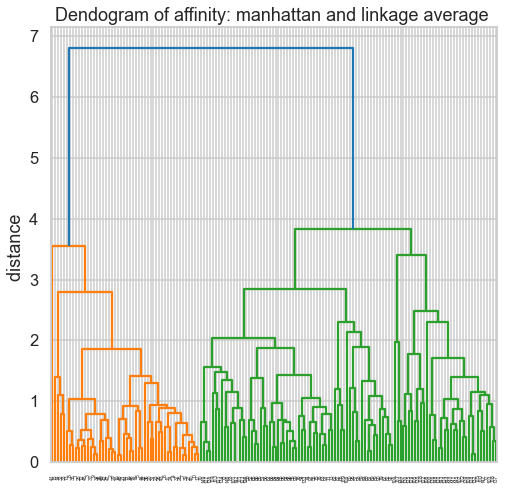

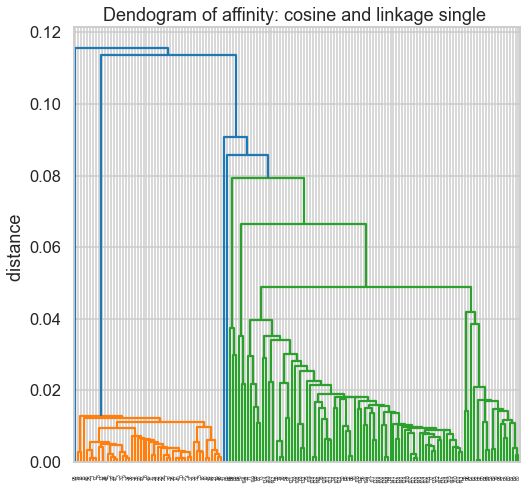

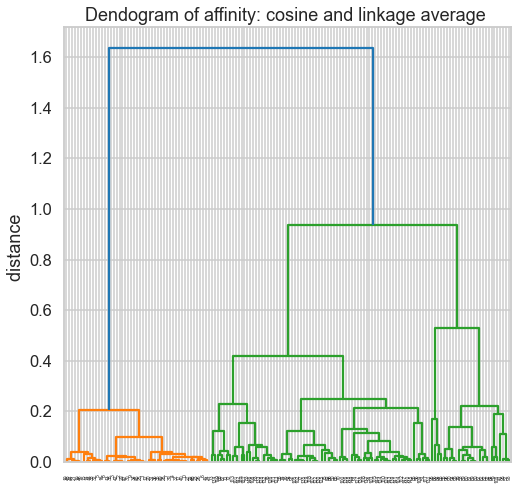

best score is  0.5817500491982808 and came from affinity  euclidean and linkage  single


In [180]:
hiearchial_clustering(scaled_iris)

best score is  0.5817500491982808 and came from eps  1.4000000000000001 and sample 5


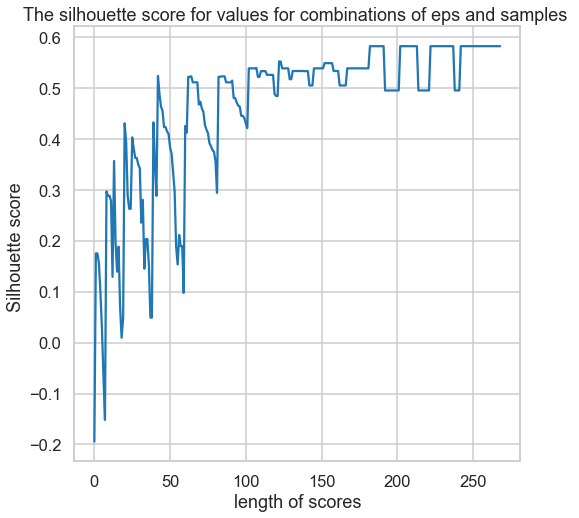

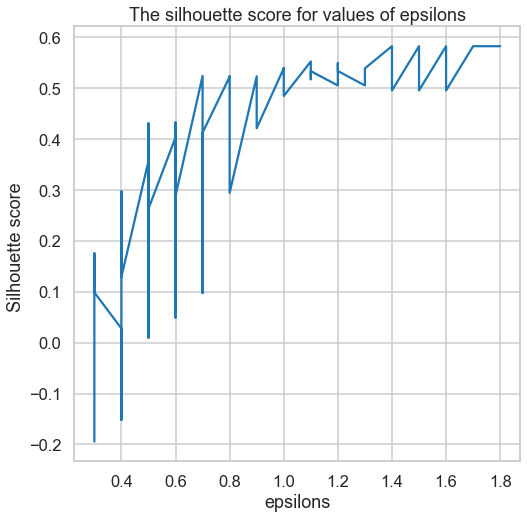

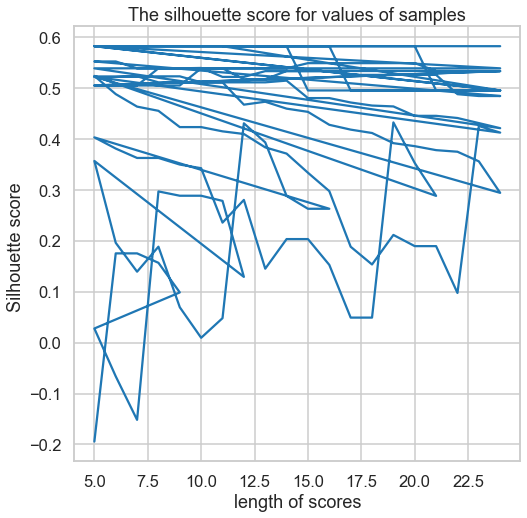

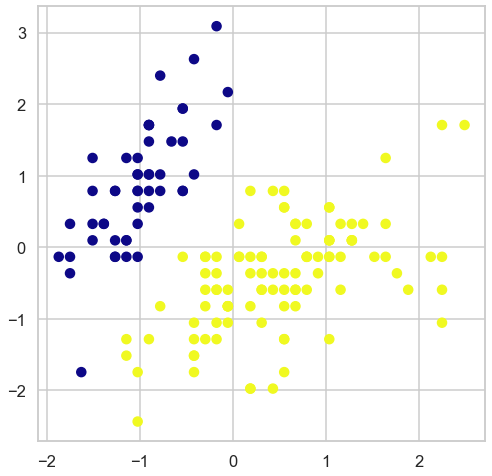

In [189]:
Dbscan(scaled_iris)

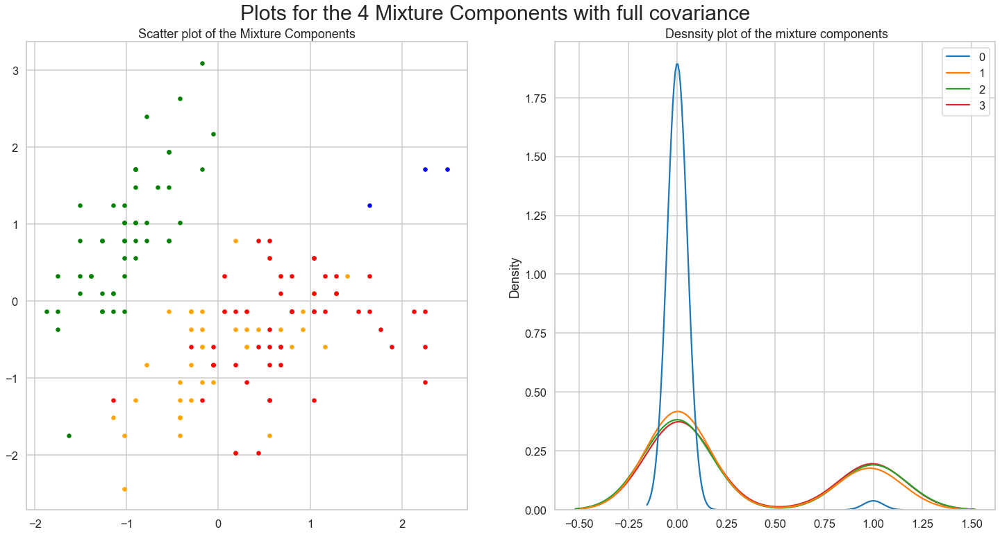

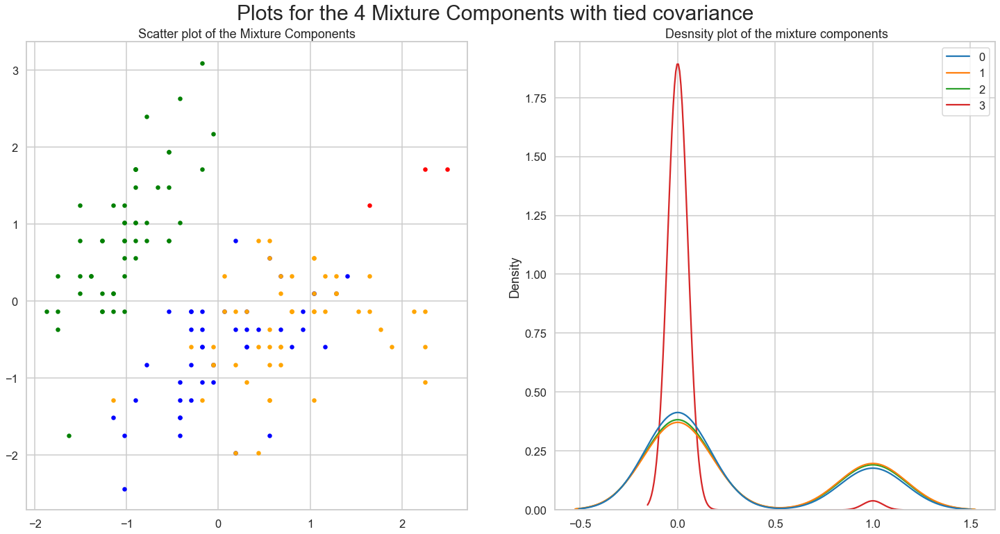

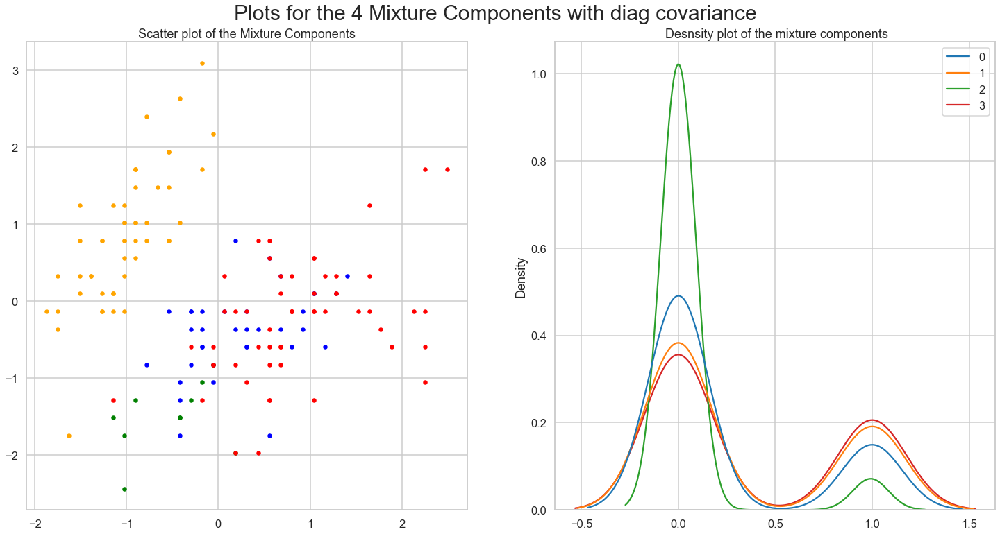

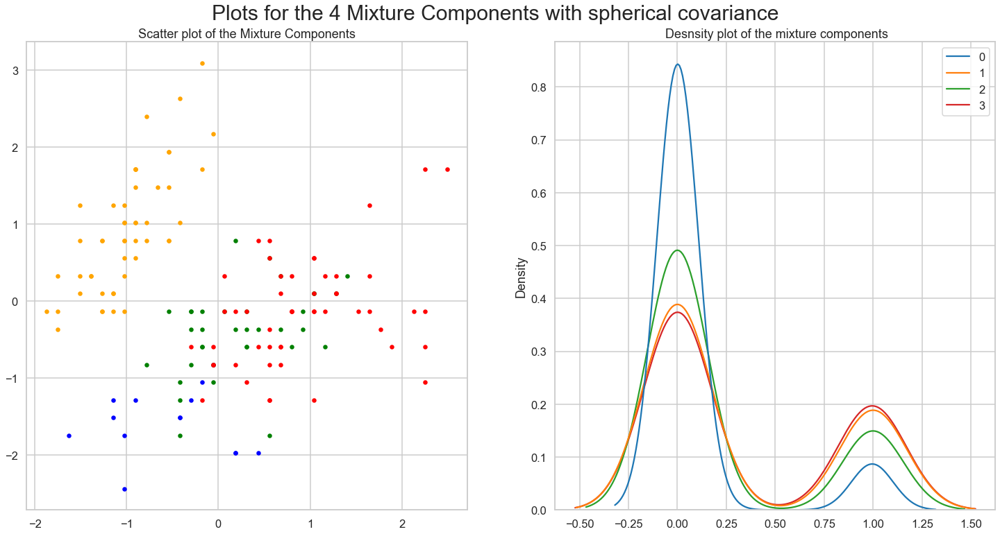

In [188]:
test = np.array(scaled_iris)
_df = pd.DataFrame(test)
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_cov(_df,covars)

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 

In [149]:
from sklearn.preprocessing import MaxAbsScaler, StandardScaler , RobustScaler , MinMaxScaler

In [210]:
data = pd.read_csv('Customer data.csv')
del data['ID']


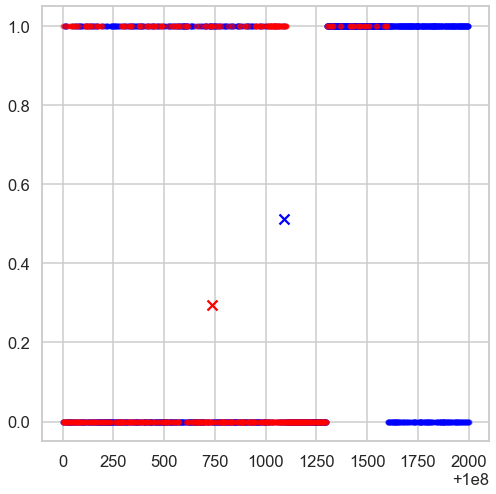

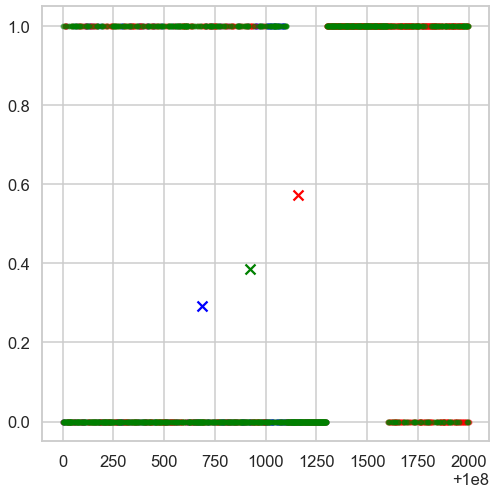

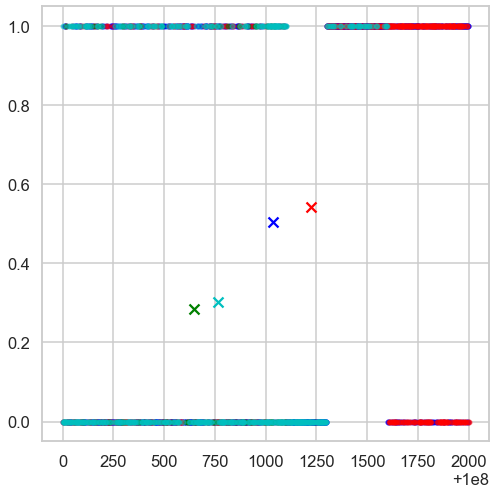

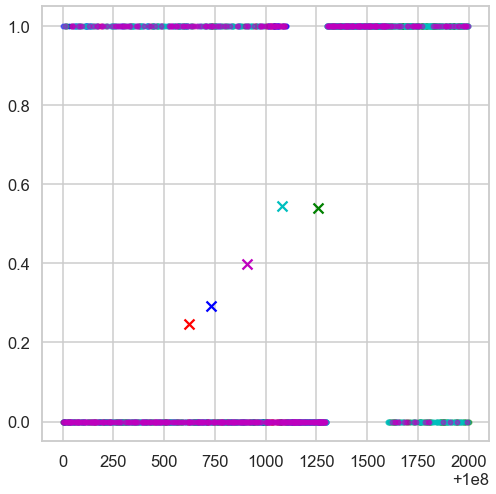

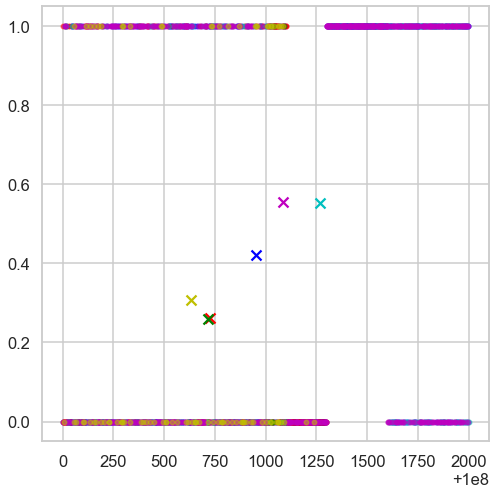

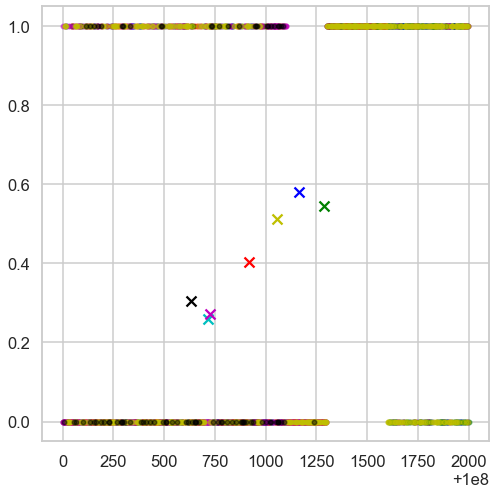

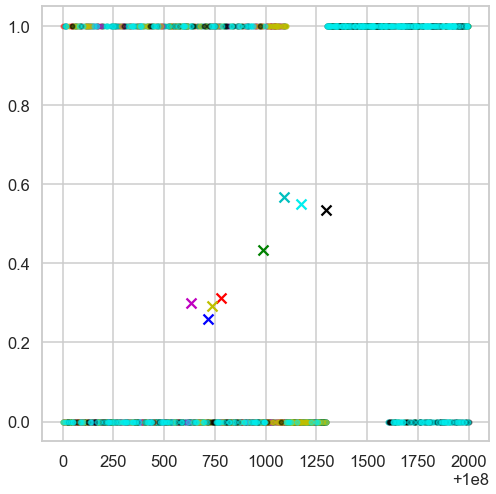

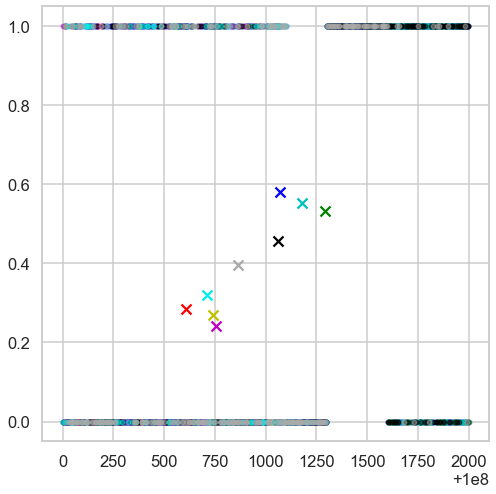

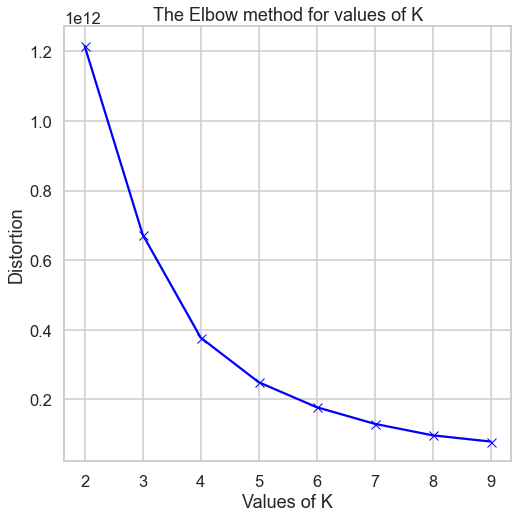

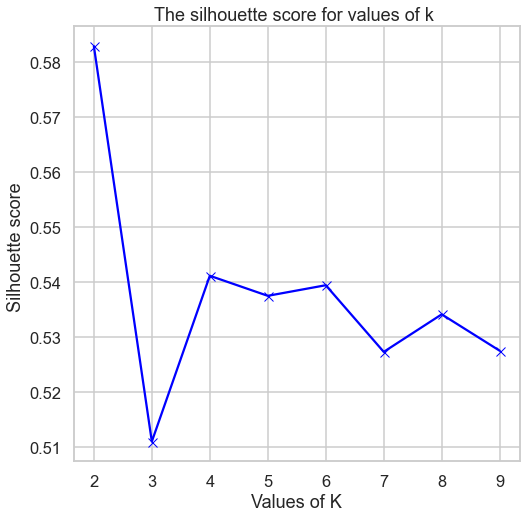

In [204]:
KMEANS(data.values)

In [ ]:
hiearchial_clustering(data.values)

In [ ]:
Dbscan(data.values)

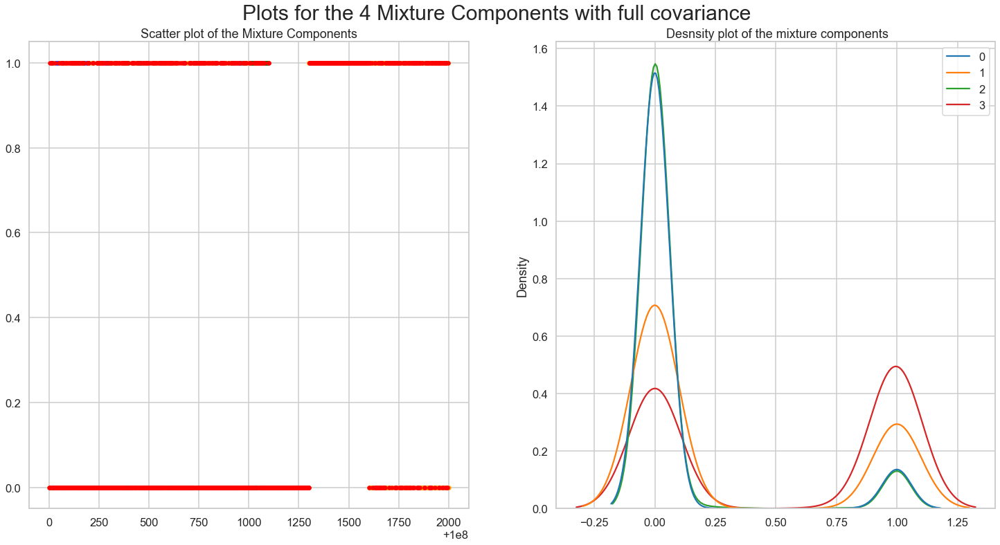

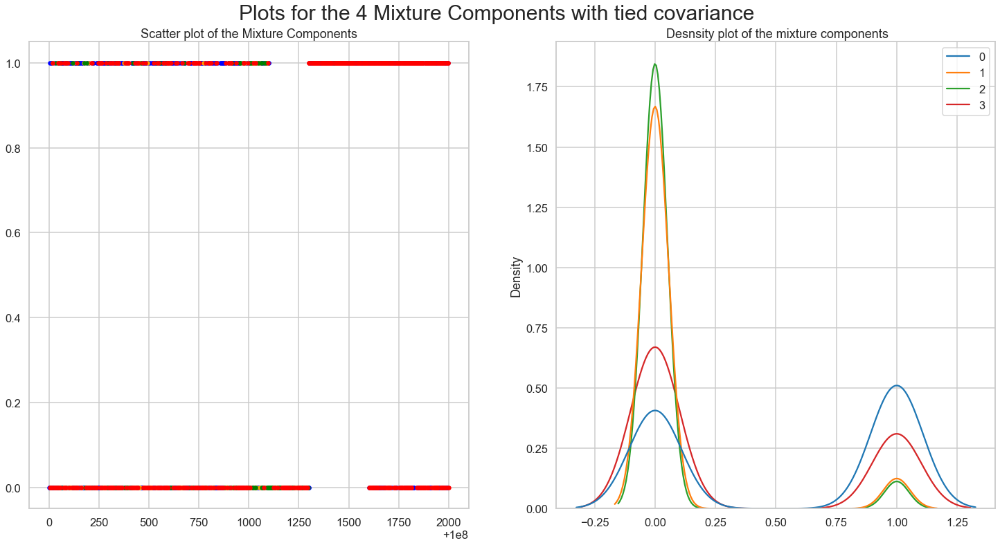

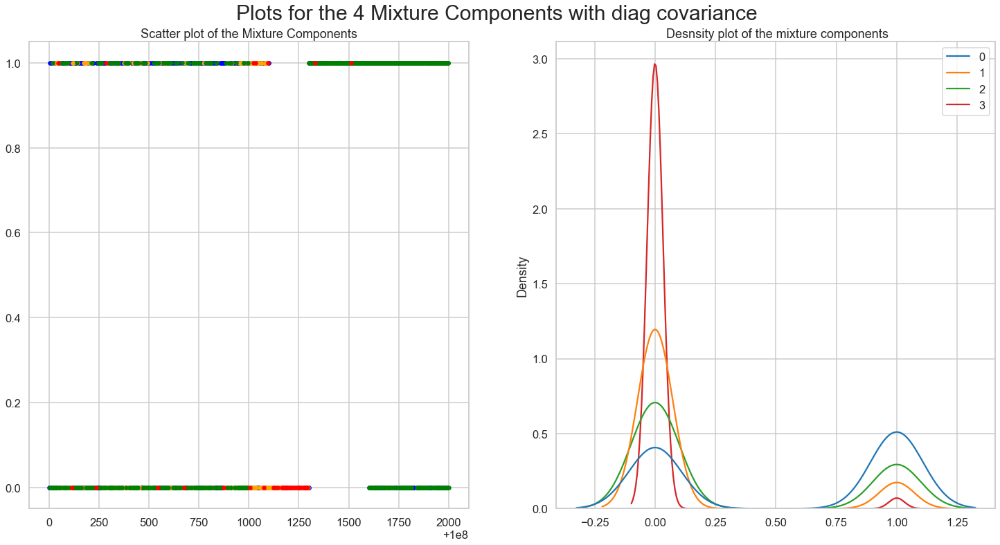

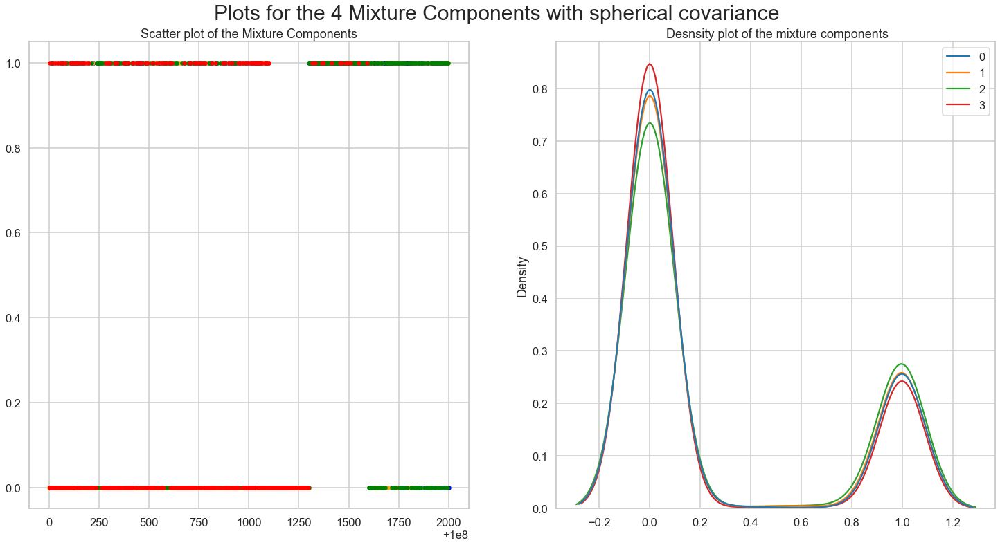

In [209]:
test = np.array(data.values)
_df = pd.DataFrame(test)
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_cov(_df,covars)

In [202]:
scaler=StandardScaler()
scaled_features = scaler.fit_transform(data)
df_feat = pd.DataFrame(scaled_features,columns=data.columns)
del df_feat['ID']
df_feat.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,-0.917399,-0.993024,2.653614,1.604323,0.097524,0.296823,1.552326
1,1.090038,1.007025,-1.187132,-0.063372,0.782654,0.296823,1.552326
2,-0.917399,-0.993024,1.117316,-0.063372,-0.833202,-1.269525,-0.909730
3,-0.917399,-0.993024,0.775916,-0.063372,1.328386,0.296823,0.321298
4,-0.917399,-0.993024,1.458716,-0.063372,0.736932,0.296823,0.321298


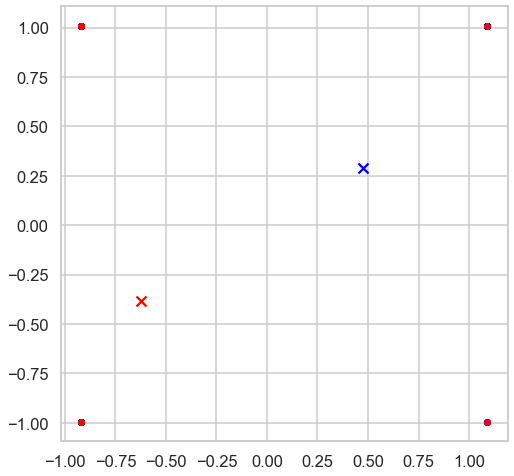

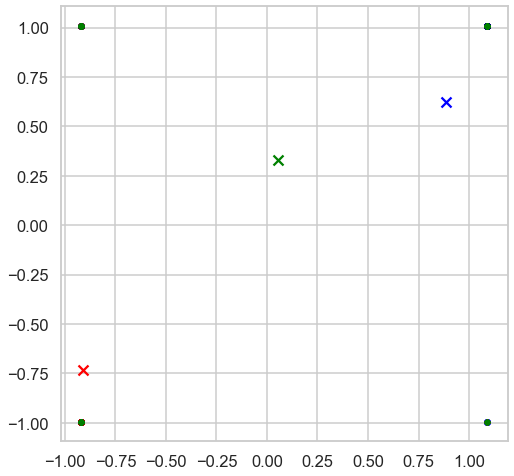

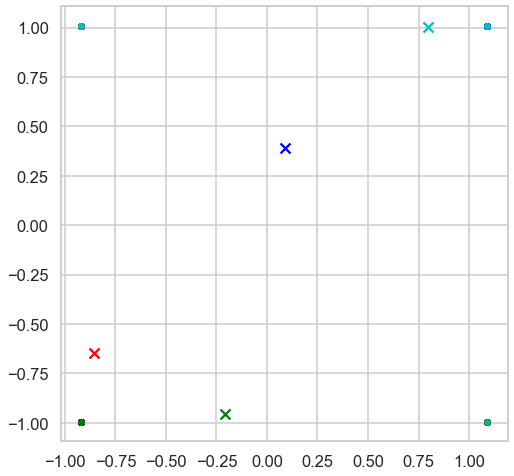

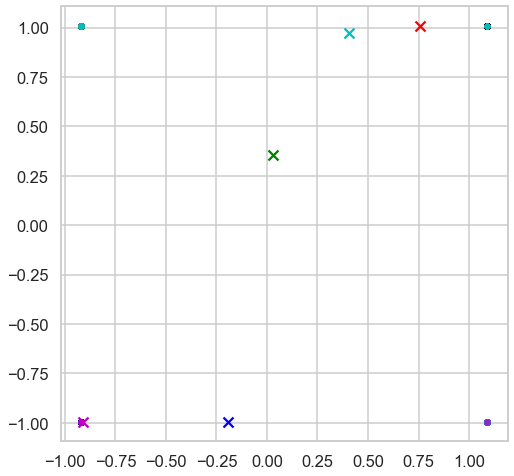

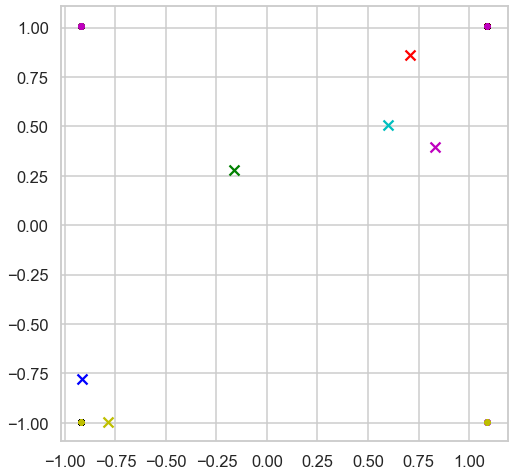

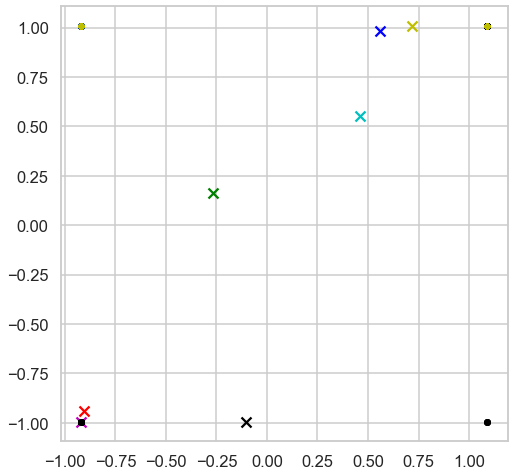

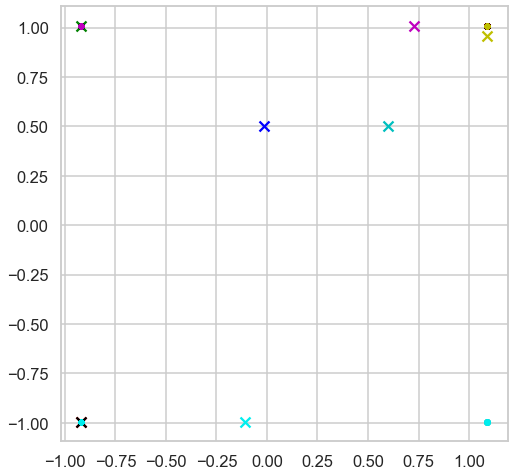

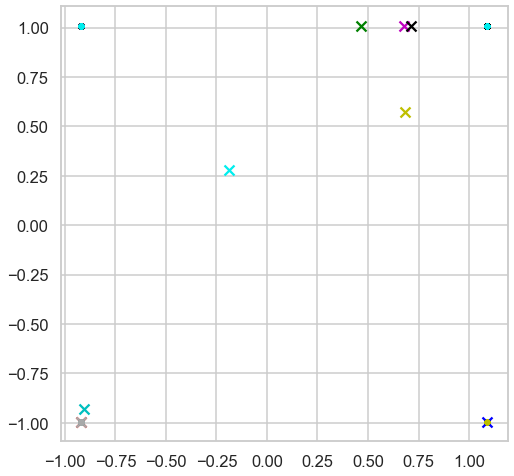

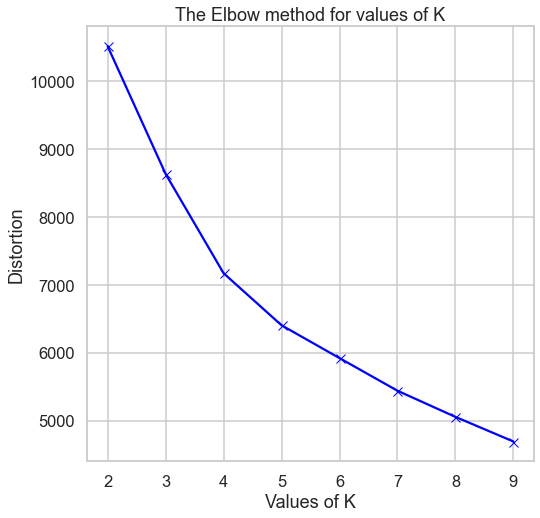

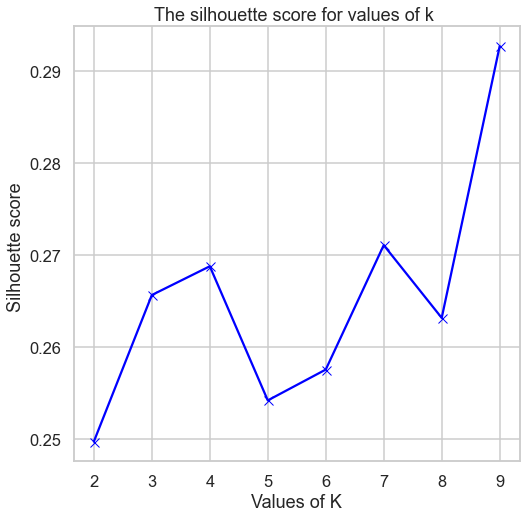

In [203]:
x=df_feat.values
KMEANS(x)


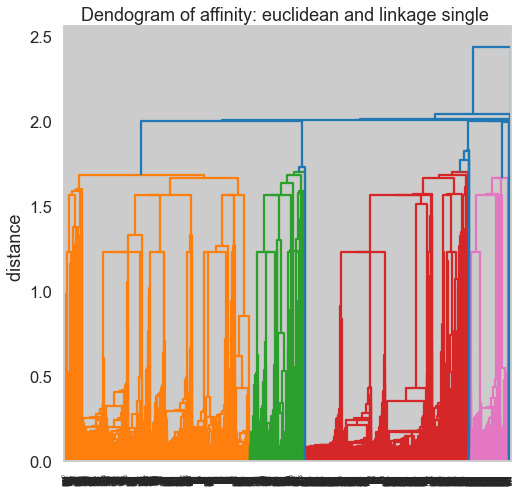

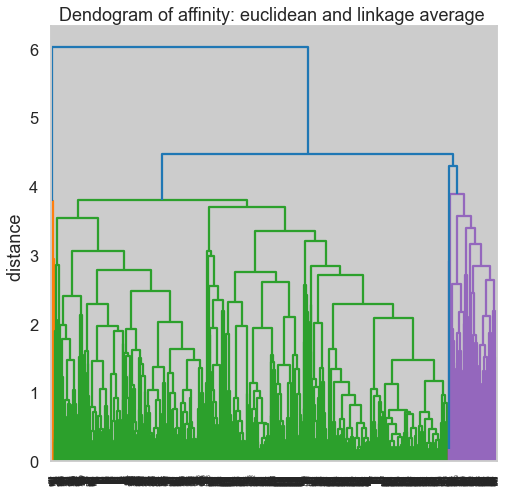

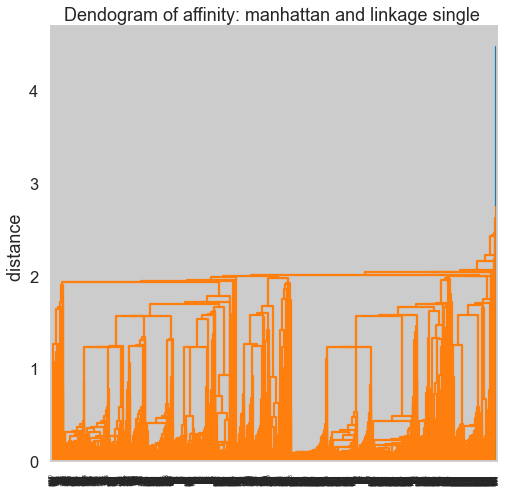

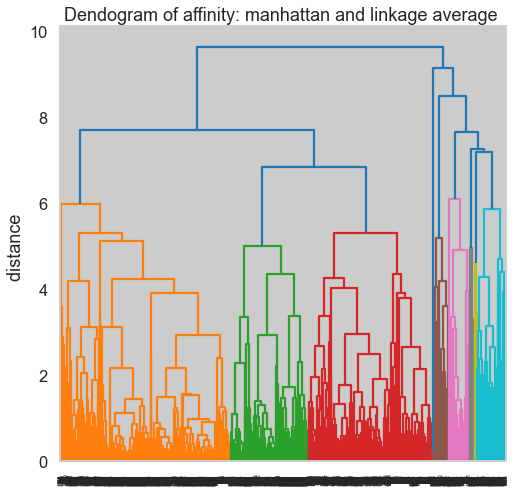

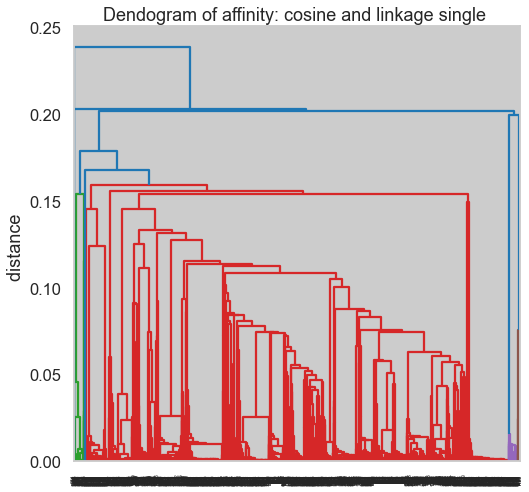

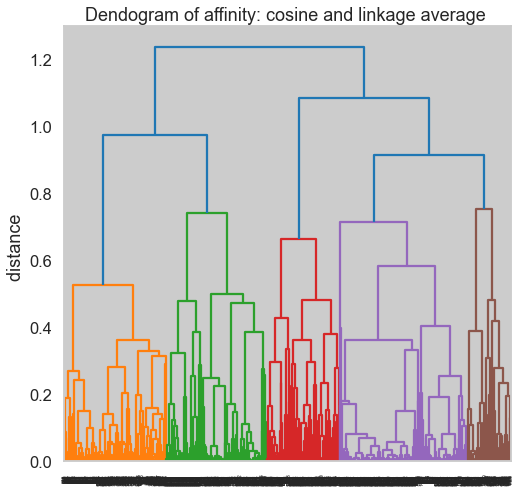

best score is  0.4622855169270614 and came from affinity  euclidean and linkage  single


In [176]:
hiearchial_clustering(x)

best score is  0.4225606832617899 and came from eps  1.2000000000000002 and sample 5


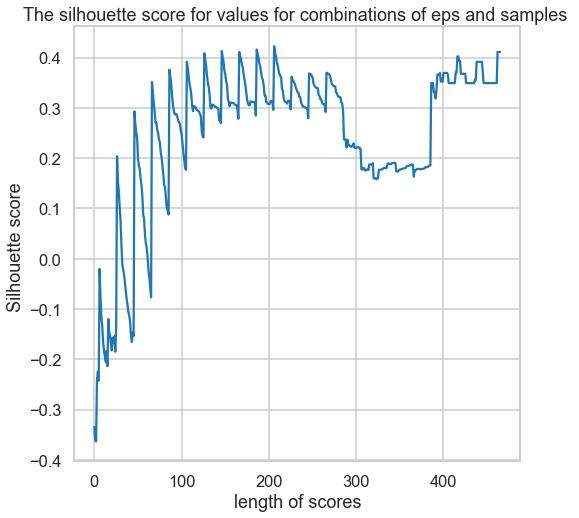

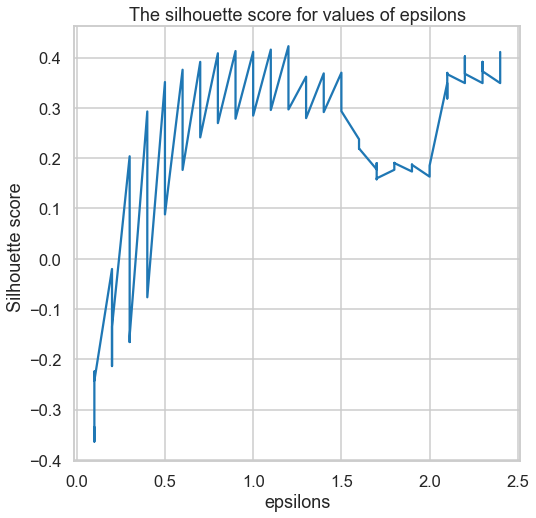

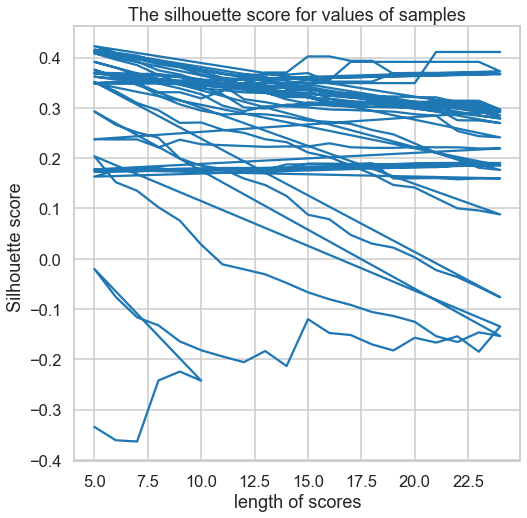

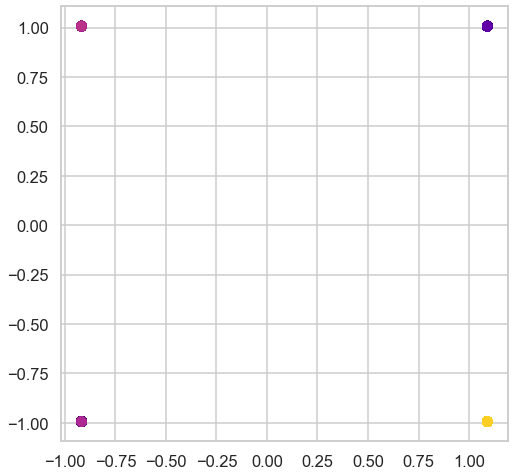

In [181]:
Dbscan(x)

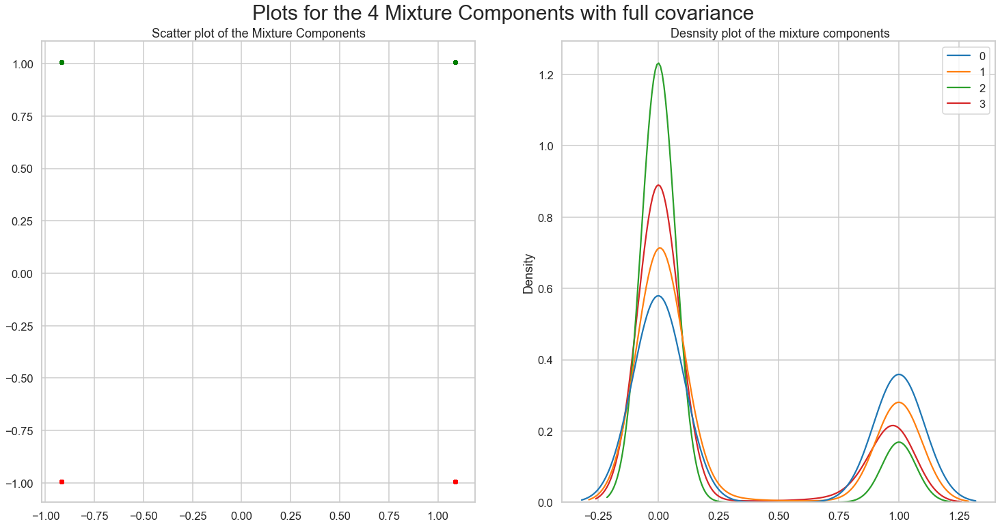

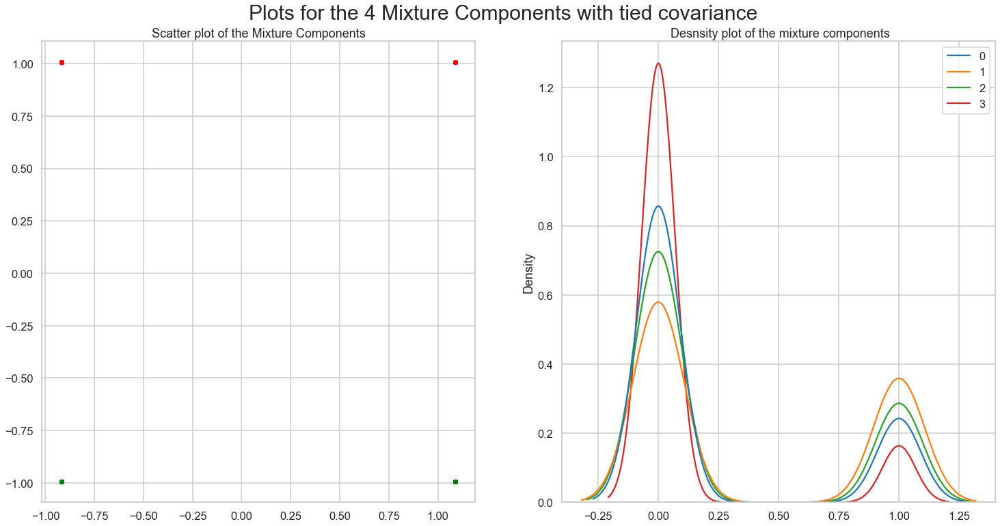

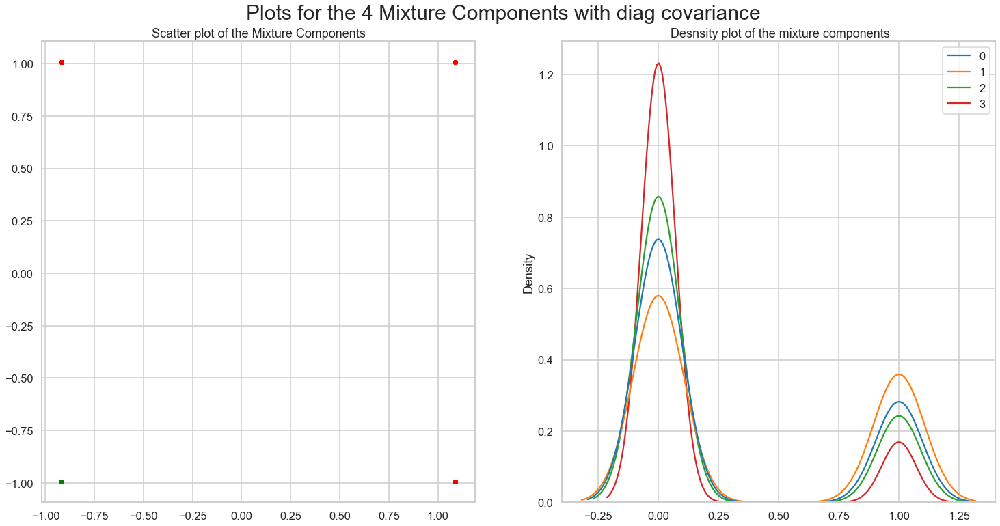

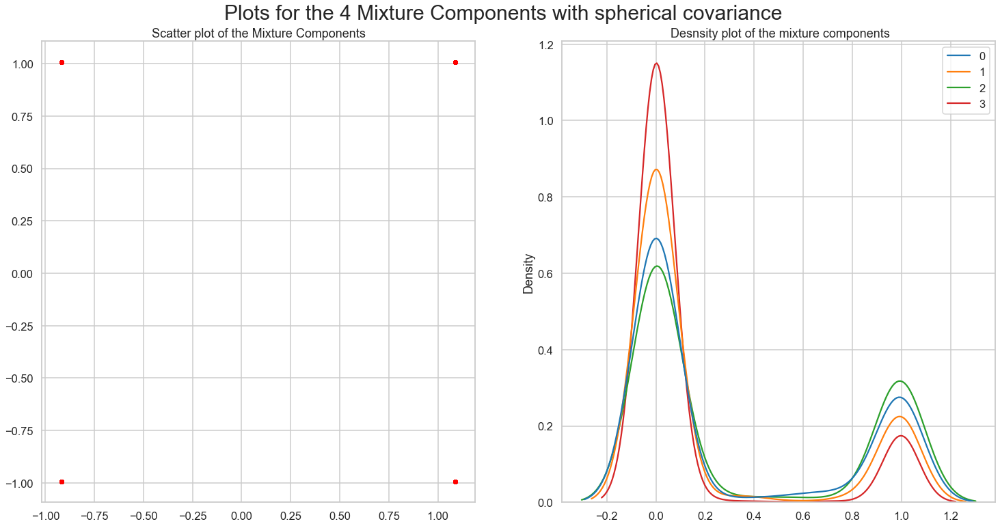

In [186]:
test = np.array(x)
_df = pd.DataFrame(test)
cov_types = ['full','tied','diag','spherical']
for covars in cov_types:
    Gaussian_cov(_df,covars)